In [1]:
import torch
torch.cuda.memory_cached()
import os
import torch
import torch.nn as nn
import numpy as np
import torch.optim as optim
from sklearn.metrics import accuracy_score, recall_score, f1_score, precision_score, confusion_matrix
import pandas as pd
from torch.utils.data import Dataset, DataLoader, Subset
# from torchvision import transforms
from PIL import Image
from torchvision import models, transforms
from sklearn.model_selection import train_test_split
import optuna
import sys
import matplotlib.pyplot as plt
import numpy as np
import cv2
from torchvision.transforms.functional import to_tensor, to_pil_image
import best_modelo_general as bmg
import best_modelo_general_colon as bmgc
import best_modelo_general_lung as bmgl
import best_modelo_general_gastrointestinal as bmgg
import best_modelo_general_oral as bmgo

# Aca va el optmizador de profundidad
import opt_deep_analysis_2_iteracion as opt_deep

sys.path.append("C:/Users/Matias/Desktop/Tesis/Tesis-Codes/utils")
import creacion_df_torch as qol



dataset_dir = r"C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasias"

# Preparar datos
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
df = qol.crear_dataframe_binario(dataset_dir, filtro_cancer='all')
train_loader, val_loader, test_loader = qol.prepare_data_loaders(df, batch_size=80, m_type='bin')

#Preparamos
import os
import pandas as pd

# Ruta al directorio del dataset
dataset_dir = r"C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasias"


# Preparar los DataLoaders (usando el DataFrame binario como ejemplo)
# Guardar el DataFrame de prueba
_, test_val_df = train_test_split(df, test_size=0.3, random_state=46, stratify=df['etiqueta'])
_, test_df = train_test_split(test_val_df, test_size=0.33, random_state=46, stratify=test_val_df['etiqueta'])



# Seleccionar una imagen del conjunto de prueba
imagen_prueba = test_df.sample(n=1).iloc[0]
ruta_imagen_prueba = imagen_prueba['ruta']

print(f"Imagen seleccionada: {ruta_imagen_prueba}")


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\cuda\memory.py:444: FutureWarning: torch.cuda.memory_cached has been renamed to torch.cuda.memory_reserved
  warnings.warn(
c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Imagen seleccionada: C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasias\ACA\lung_ACA_lungaca254.jpeg


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\cuda\memory.py:444: FutureWarning: torch.cuda.memory_cached has been renamed to torch.cuda.memory_reserved
  warnings.warn(


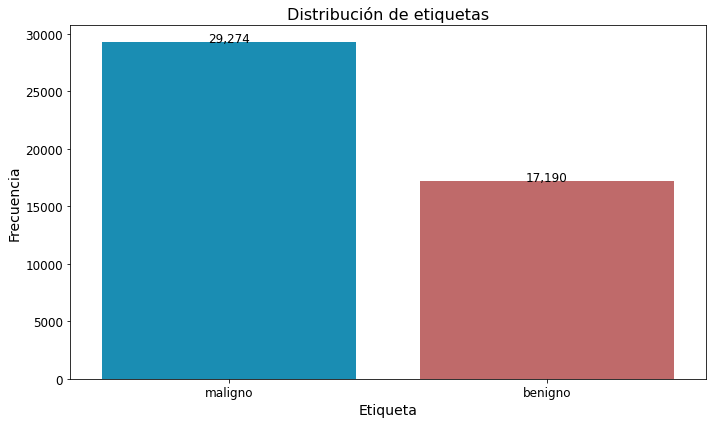

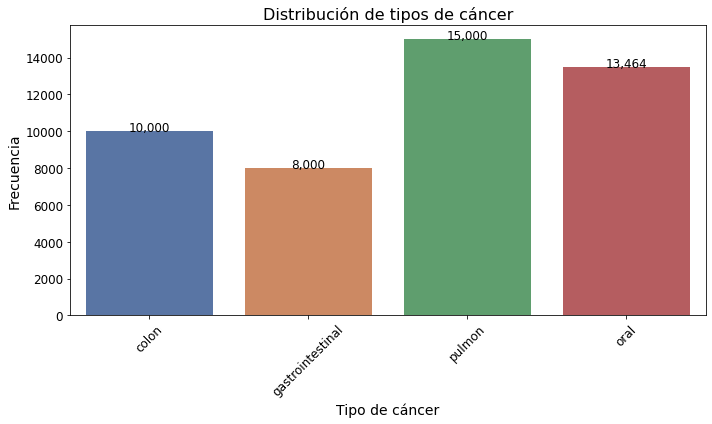

<Figure size 864x576 with 0 Axes>

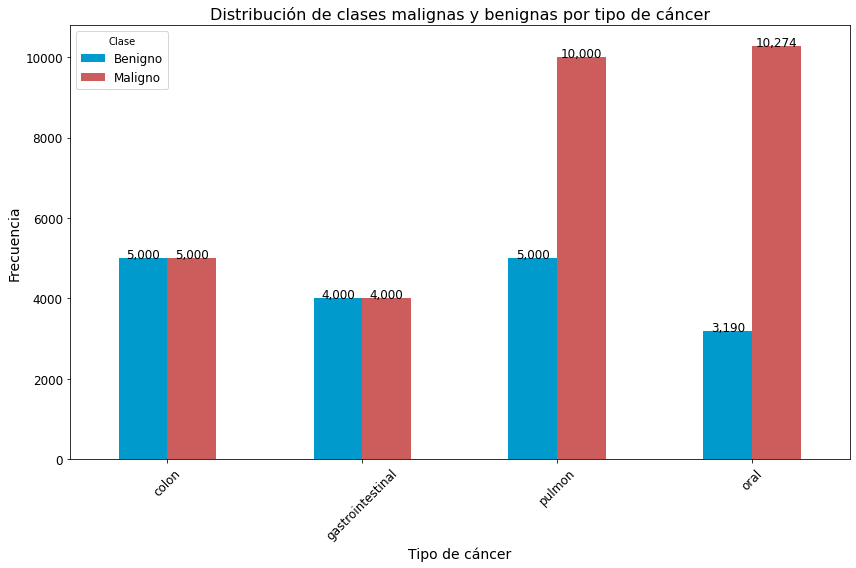

Datos Faltantes por Columna:
ruta           0
etiqueta       0
tipo_cancer    0
dtype: int64


NameError: name 'summary_table' is not defined

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Crear DataFrame desde el directorio del dataset
dataframe = qol.crear_dataframe_binario(dataset_dir)

# Ruta donde se guardarán los gráficos
save_path = r"C:\Users\Matias\Desktop\Tesis\Imagenes Tesis"

# Asegurarse de que la carpeta exista
if not os.path.exists(save_path):
    os.makedirs(save_path)

# Función para agregar valores completos encima de cada barra
def add_value_labels(ax):
    for p in ax.patches:
        _x = p.get_x() + p.get_width() / 2
        _y = p.get_height()
        value = f'{int(_y):,}'  # Mostrar el valor completo con separadores de miles
        ax.text(_x, _y, value, ha="center", fontsize=12, color='black')

# Distribución de la columna 'etiqueta' con colores más atractivos
plt.figure(figsize=(10, 6))
ax1 = sns.countplot(x='etiqueta', data=dataframe, palette=["#009ACD", "#CD5C5C"])  # Celeste para benigno y rojo suave para maligno
add_value_labels(ax1)
plt.title('Distribución de etiquetas', fontsize=16)
plt.xlabel('Etiqueta', fontsize=14)
plt.ylabel('Frecuencia', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(False)  # Sin líneas de fondo
plt.tight_layout()

# Guardar gráfico con alta calidad
plt.savefig(os.path.join(save_path, 'Distribucion_Etiquetas.png'), dpi=300)
plt.show()

# Distribución de la columna 'tipo_cancer' con valores completos
plt.figure(figsize=(10, 6))
ax2 = sns.countplot(x='tipo_cancer', data=dataframe, palette="deep")  # Mantener la paleta 'deep' para tipos de cáncer
add_value_labels(ax2)

# Cambiar la etiqueta 'lung' por 'pulmon' solo en el gráfico
ax2.set_xticklabels([label.get_text().replace('lung', 'pulmon') for label in ax2.get_xticklabels()])

plt.title('Distribución de tipos de cáncer', fontsize=16)
plt.xlabel('Tipo de cáncer', fontsize=14)
plt.ylabel('Frecuencia', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.grid(False)
plt.tight_layout()

# Guardar gráfico con alta calidad
plt.savefig(os.path.join(save_path, 'Distribucion_Tipos_Cancer.png'), dpi=300)
plt.show()

# Gráfico de la distribución de clases malignas y benignas por tipo de cáncer
plt.figure(figsize=(12, 8))

# Crear una tabla de contingencia para agrupar 'etiqueta' (benigno/maligno) por 'tipo_cancer'
class_distribution = pd.crosstab(dataframe['tipo_cancer'], dataframe['etiqueta'])

# Colores personalizados para benigno (celeste) y maligno (rojo suave)
ax3 = class_distribution.plot(kind='bar', stacked=False, color=["#009ACD", "#CD5C5C"], figsize=(12, 8))

# Cambiar la etiqueta 'lung' por 'pulmon' solo en el gráfico
ax3.set_xticklabels([label.get_text().replace('lung', 'pulmon') for label in ax3.get_xticklabels()])

# Función para agregar los valores encima de las barras
add_value_labels(ax3)

# Configurar título y etiquetas del gráfico
plt.title('Distribución de clases malignas y benignas por tipo de cáncer', fontsize=16)
plt.xlabel('Tipo de cáncer', fontsize=14)
plt.ylabel('Frecuencia', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)

# Guardar gráfico con alta calidad
plt.legend(title='Clase', labels=['Benigno', 'Maligno'], fontsize=12)
plt.grid(False)  # Sin líneas de fondo
plt.tight_layout()
plt.savefig(os.path.join(save_path, 'Distribucion_Clases_Tipo_Cancer.png'), dpi=300)
plt.show()

# Mostrar la cantidad de datos faltantes por columna
missing_values = dataframe.isnull().sum()
print("Datos Faltantes por Columna:")
print(missing_values)

# Crear una tabla de resumen estéticamente agradable
summary_table_styled = summary_table.style.set_properties(**{
    'background-color': '#f5f5f5',
    'color': '#333',
    'border-color': 'black',
    'text-align': 'center'
}).set_caption('Tabla Resumen Estadístico')

summary_table_styled


### Redes preentrenadas

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Crear DataFrame desde el directorio del dataset
dataframe = qol.crear_dataframe_binario(dataset_dir)

# Ruta donde se guardarán los gráficos
save_path = r"C:\Users\Matias\Desktop\Tesis\Imagenes Tesis"

# Asegurarse de que la carpeta exista
if not os.path.exists(save_path):
    os.makedirs(save_path)

# Función para agregar valores completos encima de cada barra
def add_value_labels(ax):
    for p in ax.patches:
        _x = p.get_x() + p.get_width() / 2
        _y = p.get_height()
        value = f'{int(_y):,}'  # Mostrar el valor completo con separadores de miles
        ax.text(_x, _y, value, ha="center", fontsize=12, color='black')

# Distribución de la columna 'etiqueta' con colores más atractivos
plt.figure(figsize=(10, 6))
ax1 = sns.countplot(x='etiqueta', data=dataframe, palette=["#009ACD", "#CD5C5C"])  # Celeste para benigno y rojo suave para maligno
add_value_labels(ax1)
plt.title('Distribución de etiquetas', fontsize=16)
plt.xlabel('Etiqueta', fontsize=14)
plt.ylabel('Frecuencia', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(False)  # Sin líneas de fondo
plt.tight_layout()

# Guardar gráfico con alta calidad
plt.savefig(os.path.join(save_path, 'Distribucion_Etiquetas.png'), dpi=300)
plt.show()

# Distribución de la columna 'tipo_cancer' con valores completos
plt.figure(figsize=(10, 6))
ax2 = sns.countplot(x='tipo_cancer', data=dataframe, palette="deep")  # Mantener la paleta 'deep' para tipos de cáncer
add_value_labels(ax2)

# Cambiar la etiqueta 'lung' por 'pulmon' solo en el gráfico
ax2.set_xticklabels([label.get_text().replace('lung', 'pulmon') for label in ax2.get_xticklabels()])

plt.title('Distribución de tipos de cáncer', fontsize=16)
plt.xlabel('Tipo de cáncer', fontsize=14)
plt.ylabel('Frecuencia', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.grid(False)
plt.tight_layout()

# Guardar gráfico con alta calidad
plt.savefig(os.path.join(save_path, 'Distribucion_Tipos_Cancer.png'), dpi=300)
plt.show()

# Gráfico de la distribución de clases malignas y benignas por tipo de cáncer
plt.figure(figsize=(12, 8))

# Crear una tabla de contingencia para agrupar 'etiqueta' (benigno/maligno) por 'tipo_cancer'
class_distribution = pd.crosstab(dataframe['tipo_cancer'], dataframe['etiqueta'])

# Colores personalizados para benigno (celeste) y maligno (rojo suave)
ax3 = class_distribution.plot(kind='bar', stacked=False, color=["#009ACD", "#CD5C5C"], figsize=(12, 8))

# Cambiar la etiqueta 'lung' por 'pulmon' solo en el gráfico
ax3.set_xticklabels([label.get_text().replace('lung', 'pulmon') for label in ax3.get_xticklabels()])

# Función para agregar los valores encima de las barras
add_value_labels(ax3)

# Configurar título y etiquetas del gráfico
plt.title('Distribución de clases malignas y benignas por tipo de cáncer', fontsize=16)
plt.xlabel('Tipo de cáncer', fontsize=14)
plt.ylabel('Frecuencia', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)

# Guardar gráfico con alta calidad
plt.legend(title='Clase', labels=['Benigno', 'Maligno'], fontsize=12)
plt.grid(False)  # Sin líneas de fondo
plt.tight_layout()
plt.savefig(os.path.join(save_path, 'Distribucion_Clases_Tipo_Cancer.png'), dpi=300)
plt.show()

# Mostrar la cantidad de datos faltantes por columna
missing_values = dataframe.isnull().sum()
print("Datos Faltantes por Columna:")
print(missing_values)

# Crear una tabla de resumen estéticamente agradable
summary_table_styled = summary_table.style.set_properties(**{
    'background-color': '#f5f5f5',
    'color': '#333',
    'border-color': 'black',
    'text-align': 'center'
}).set_caption('Tabla Resumen Estadístico')

summary_table_styled


NameError: name 'qol' is not defined

# Modelos ya entrenados previamente 


In [4]:
'''model_bmg= bmg.Net()
model_bmg.load_state_dict(torch.load('C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmg.pt', map_location="cuda:0"))


model_bmgc222222= bmg.Net()
model_bmgc.load_state_dict(torch.load('C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgc.pt', map_location="cuda:0"))

model_bmgl= bmg.Net()
model_bmgl.load_state_dict(torch.load('C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgl.pt', map_location="cuda:0"))

model_bmgo= bmg.Net()
model_bmgo.load_state_dict(torch.load('C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgo.pt', map_location="cuda:0"))

'''





'model_bmg= bmg.Net()\nmodel_bmg.load_state_dict(torch.load(\'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmg.pt\', map_location="cuda:0"))\n\n\nmodel_bmgc222222= bmg.Net()\nmodel_bmgc.load_state_dict(torch.load(\'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgc.pt\', map_location="cuda:0"))\n\nmodel_bmgl= bmg.Net()\nmodel_bmgl.load_state_dict(torch.load(\'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgl.pt\', map_location="cuda:0"))\n\nmodel_bmgo= bmg.Net()\nmodel_bmgo.load_state_dict(torch.load(\'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgo.pt\', map_location="cuda:0"))\n\n'

# Modelos Binarios Cancer-No Cancer

## Modelo General 4 tipos de Cancer

### Mejor modelo iteraciones

In [5]:

# Entrenar modelo
model_bmg = bmg.train_model(device, train_loader, val_loader)
#Cargamos el modelo si ya lo tenemos entrenado


# Evaluar modelo
test_accuracy = qol.evaluate_model(device, model_bmg, test_loader)
print(f'Final Test Accuracy: {test_accuracy:.4f}')


try:
    # Ejemplo de uso
    val_metrics, test_metrics = qol.evaluate_model_with_metrics(device, model_bmg, val_loader, test_loader)
    print(f'Final Validation Metrics: Accuracy={val_metrics[0]:.4f}, Recall={val_metrics[1]:.4f}, Precision={val_metrics[2]:.4f}, F1={val_metrics[3]:.4f}')
    print(f'Final Test Metrics: Accuracy={test_metrics[0]:.4f}, Recall={test_metrics[1]:.4f}, Precision={test_metrics[2]:.4f}, F1={test_metrics[3]:.4f}')
except:
    print('error')

Validation Accuracy: 0.9171
Test Accuracy: 0.9209
Final Test Accuracy: 0.9209
Validation Accuracy: 0.9171
Test Accuracy: 0.9209
Final Validation Metrics: Accuracy=0.9171, Recall=0.9044, Precision=0.9167, F1=0.9098
Final Test Metrics: Accuracy=0.9209, Recall=0.9063, Precision=0.9231, F1=0.9135


# Optimizacion profundidad

In [ ]:
# Definir el estudio
try:
    study_general = optuna.create_study(storage="sqlite:///general_model_opt_deep_2_iteracion.db", study_name="Estudio Clasificador General Deep 2",direction='maximize')
    study_general.optimize(lambda trial: opt_deep.objective(trial, cancer='all'), n_trials=50, timeout=50000)
except Exception as e:
    print(f"Error during optimization: {e}")

# Guardar el mejor modelo
best_trial = study_general.best_trial
try:
    best_model =opt_deep.Net(
        [best_trial.params[f'num_filters_layer{i}'] for i in range(best_trial.params['num_layers'])], 
        best_trial.params['kernel_size'], 
        best_trial.params['dropout_rate'], 
        2,
        best_trial.params['num_fc_layers']
    ).to(device)
    
    optimizer = optim.Adam(best_model.parameters(), lr=best_trial.params['learning_rate'])
    criterion = nn.CrossEntropyLoss()
    
    # Entrenamiento
    best_model.train()
    for epoch in range(10):
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            output = best_model(images)
            loss = criterion(output, labels)
            loss.backward()
            optimizer.step()
            # Free GPU memory
            del images, labels, output
            torch.cuda.empty_cache()
    
    # Guardar el modelo entrenado
    torch.save(best_model.state_dict(), 'general_model_opt_deep.pth')
    
    # Evaluar el mejor modelo en el conjunto de prueba
    best_model.eval()
    all_labels = []
    all_predictions = []
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = best_model(images)
            _, predicted = torch.max(outputs, 1)
            all_labels.extend(labels.cpu().numpy())
            all_predictions.extend(predicted.cpu().numpy())
            # Free GPU memory
            del images, labels, outputs
            torch.cuda.empty_cache()

    test_accuracy = accuracy_score(all_labels, all_predictions)
    test_recall = recall_score(all_labels, all_predictions, average='weighted')
    test_precision = precision_score(all_labels, all_predictions, average='weighted')
    test_f1 = f1_score(all_labels, all_predictions, average='weighted')

    print(f'Final Test Accuracy: {test_accuracy:.4f}')
    print(f'Final Test Recall: {test_recall:.4f}')
    print(f'Final Test Precision: {test_precision:.4f}')
    print(f'Final Test F1 Score: {test_f1:.4f}')

except Exception as e:
    print(f"Error during model evaluation: {e}")
    # Intentar cargar el último mejor modelo guardado si es posible
    try:
        best_model.load_state_dict(torch.load('general_model_opt_deep.pth'))
        best_model.eval()
        all_labels = []
        all_predictions = []
        with torch.no_grad():
            for images, labels in test_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = best_model(images)
                _, predicted = torch.max(outputs, 1)
                all_labels.extend(labels.cpu().numpy())
                all_predictions.extend(predicted.cpu().numpy())
                # Free GPU memory
                del images, labels, outputs
                torch.cuda.empty_cache()
    
        test_accuracy = accuracy_score(all_labels, all_predictions)
        test_recall = recall_score(all_labels, all_predictions, average='weighted')
        test_precision = precision_score(all_labels, all_predictions, average='weighted')
        test_f1 = f1_score(all_labels, all_predictions, average='weighted')
    
        print(f'Final Test Accuracy: {test_accuracy:.4f}')
        print(f'Final Test Recall: {test_recall:.4f}')
        print(f'Final Test Precision: {test_precision:.4f}')
        print(f'Final Test F1 Score: {test_f1:.4f}')
    except Exception as e:
        print(f"Failed to load the last best model: {e}")

[I 2024-10-06 16:58:08,393] A new study created in RDB with name: Estudio Clasificador General Deep 2


### Redes preentrenadas

DataFrames divididos con éxito
Found 36193 validated image filenames belonging to 2 classes.
Found 6777 validated image filenames belonging to 2 classes.


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\legacy\preprocessing\image.py:920: UserWarning: Found 978 invalid image filename(s) in x_col="ruta". These filename(s) will be ignored.
  warnings.warn(
c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\legacy\preprocessing\image.py:920: UserWarning: Found 192 invalid image filename(s) in x_col="ruta". These filename(s) will be ignored.
  warnings.warn(


Found 2270 validated image filenames belonging to 2 classes.
Generadores creados con éxito
Entrenando el modelo resnet...


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\legacy\preprocessing\image.py:920: UserWarning: Found 54 invalid image filename(s) in x_col="ruta". These filename(s) will be ignored.
  warnings.warn(


Epoch 1/10


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1810/1810 ━━━━━━━━━━━━━━━━━━━━ 808s 445ms/step - accuracy: 0.6238 - loss: 0.6766 - val_accuracy: 0.7438 - val_loss: 0.6210
Epoch 2/10
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 804s 444ms/step - accuracy: 0.6852 - loss: 0.6022 - val_accuracy: 0.7490 - val_loss: 0.5232
Epoch 3/10
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 803s 444ms/step - accuracy: 0.7424 - loss: 0.5409 - val_accuracy: 0.7490 - val_loss: 0.5044
Epoch 4/10
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 804s 444ms/step - accuracy: 0.7565 - loss: 0.5210 - val_accuracy: 0.6488 - val_loss: 0.6548
Epoch 5/10
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 804s 444ms/step - accuracy: 0.7585 - loss: 0.5139 - val_accuracy: 0.7525 - val_loss: 0.5164
Epoch 6/10
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 804s 444ms/step - accuracy: 0.7661 - loss: 0.5041 - val_accuracy: 0.7983 - val_loss: 0.4634
Epoch 7/10
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 804s 444ms/step - accuracy: 0.7800 - loss: 0.4815 - val_accuracy: 0.7967 - val_loss: 0.4592
Epoch 8/10
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 804s 444ms/step - accuracy: 0.7

Modelo resnet entrenado con éxito
339/339 ━━━━━━━━━━━━━━━━━━━━ 128s 375ms/step


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


114/114 ━━━━━━━━━━━━━━━━━━━━ 42s 371ms/step
Final Validation Metrics for resnet: Accuracy=0.7915, Recall=0.9295, Precision=0.7782, F1=0.8471
Final Test Metrics for resnet: Accuracy=0.8004, Recall=0.9139, Precision=0.8000, F1=0.8532


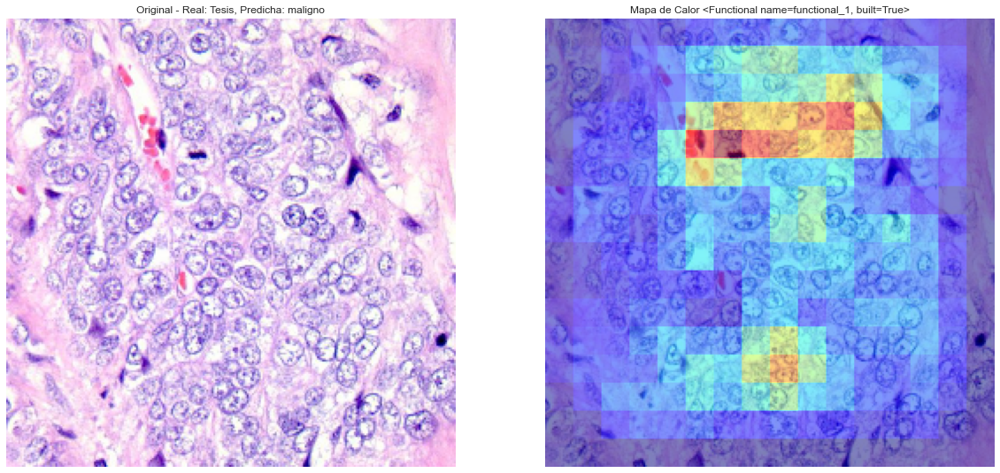

Entrenando el modelo vgg...
Epoch 1/10
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 1914s 1s/step - accuracy: 0.8706 - loss: 0.3075 - val_accuracy: 0.9292 - val_loss: 0.1628
Epoch 2/10
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 1913s 1s/step - accuracy: 0.9333 - loss: 0.1591 - val_accuracy: 0.9315 - val_loss: 0.1697
Epoch 3/10
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 1913s 1s/step - accuracy: 0.9385 - loss: 0.1375 - val_accuracy: 0.9367 - val_loss: 0.1499
Epoch 4/10
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 1913s 1s/step - accuracy: 0.9476 - loss: 0.1175 - val_accuracy: 0.9523 - val_loss: 0.1128
Epoch 5/10
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 1913s 1s/step - accuracy: 0.9547 - loss: 0.1079 - val_accuracy: 0.9577 - val_loss: 0.1054
Epoch 6/10
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 1913s 1s/step - accuracy: 0.9587 - loss: 0.0992 - val_accuracy: 0.9603 - val_loss: 0.0985
Epoch 7/10
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 1912s 1s/step - accuracy: 0.9635 - loss: 0.0890 - val_accuracy: 0.9588 - val_loss: 0.0938
Epoch 8/10
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 1912s 

Modelo vgg entrenado con éxito
339/339 ━━━━━━━━━━━━━━━━━━━━ 301s 889ms/step
114/114 ━━━━━━━━━━━━━━━━━━━━ 101s 885ms/step
Final Validation Metrics for vgg: Accuracy=0.9644, Recall=0.9734, Precision=0.9695, F1=0.9714
Final Test Metrics for vgg: Accuracy=0.9617, Recall=0.9688, Precision=0.9708, F1=0.9698


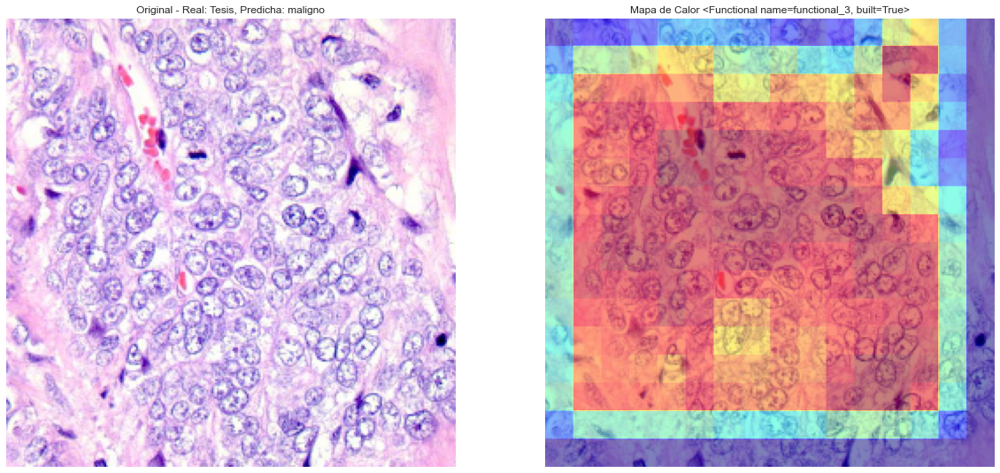

Entrenando el modelo densenet...
Epoch 1/10
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 920s 506ms/step - accuracy: 0.9169 - loss: 0.1976 - val_accuracy: 0.9593 - val_loss: 0.1001
Epoch 2/10
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 889s 491ms/step - accuracy: 0.9644 - loss: 0.0877 - val_accuracy: 0.9733 - val_loss: 0.0736
Epoch 3/10
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 893s 493ms/step - accuracy: 0.9778 - loss: 0.0570 - val_accuracy: 0.9733 - val_loss: 0.0679
Epoch 4/10
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 891s 492ms/step - accuracy: 0.9832 - loss: 0.0457 - val_accuracy: 0.9826 - val_loss: 0.0461
Epoch 5/10
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 890s 491ms/step - accuracy: 0.9867 - loss: 0.0348 - val_accuracy: 0.9833 - val_loss: 0.0491
Epoch 6/10
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 890s 491ms/step - accuracy: 0.9896 - loss: 0.0300 - val_accuracy: 0.9844 - val_loss: 0.0449
Epoch 7/10
1810/1810 ━━━━━━━━━━━━━━━━━━━━ 890s 492ms/step - accuracy: 0.9922 - loss: 0.0223 - val_accuracy: 0.9858 - val_loss: 0.0441
Epoch 8/10
1810/1810 ━━━━━━━━

Modelo densenet entrenado con éxito
339/339 ━━━━━━━━━━━━━━━━━━━━ 142s 413ms/step
114/114 ━━━━━━━━━━━━━━━━━━━━ 46s 405ms/step
Final Validation Metrics for densenet: Accuracy=0.9848, Recall=0.9960, Precision=0.9799, F1=0.9879
Final Test Metrics for densenet: Accuracy=0.9815, Recall=0.9924, Precision=0.9788, F1=0.9855


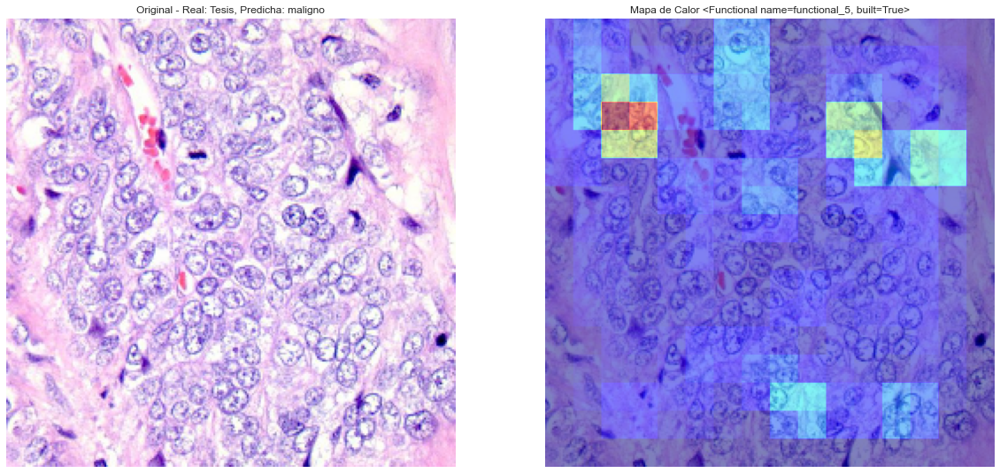

In [7]:
# Dividir el DataFrame en conjuntos de entrenamiento, validación y prueba
df_train, df_val, df_test = dividir_dataframe(df)
print("DataFrames divididos con éxito")

# Crear generadores de datos
train_gen, val_gen = crear_generadores_por_tipo(df_train, df_val)
test_gen = crear_generador_test(df_test)
print("Generadores creados con éxito")

# Entrenar y evaluar los modelos preentrenados para un tipo de cáncer específico o para todos
modelos_preentrenados = ['resnet', 'vgg', 'densenet']

for model_name in modelos_preentrenados:
    print(f"Entrenando el modelo {model_name}...")
    model = get_pretrained_model(model_name)
    model, history = entrenar_modelo(model, train_gen, val_gen, 'all', model_name)
    print(f"Modelo {model_name} entrenado con éxito")

    # Calcular y mostrar métricas de validación y prueba
    val_metrics = calcular_metricas(model, val_gen)
    test_metrics = calcular_metricas(model, test_gen)
    
    print(f'Final Validation Metrics for {model_name}: Accuracy={val_metrics[0]:.4f}, Recall={val_metrics[1]:.4f}, Precision={val_metrics[2]:.4f}, F1={val_metrics[3]:.4f}')
    print(f'Final Test Metrics for {model_name}: Accuracy={test_metrics[0]:.4f}, Recall={test_metrics[1]:.4f}, Precision={test_metrics[2]:.4f}, F1={test_metrics[3]:.4f}')

    # Ejemplo de uso para generar y mostrar un mapa de calor
    ruta_imagen_ejemplo = df['ruta'].iloc[0]
    generar_mostrar_mapa_calor(ruta_imagen_ejemplo, model)


## Modelo Binario Colon

In [4]:
df_colon = qol.crear_dataframe_binario(dataset_dir, filtro_cancer='colon')
# Preparar los DataLoaders (usando el DataFrame binario como ejemplo)
# Guardar el DataFrame de prueba
_, test_val_df = train_test_split(df_colon, test_size=0.3, random_state=46, stratify=df_colon['etiqueta'])
_, test_df = train_test_split(test_val_df, test_size=0.33, random_state=46, stratify=test_val_df['etiqueta'])

# Seleccionar una imagen del conjunto de prueba
imagen_prueba = test_df.sample(n=1).iloc[0]
ruta_imagen_prueba = imagen_prueba['ruta']

print(f"Imagen seleccionada: {ruta_imagen_prueba}")
train_loader_colon, val_loader_colon, test_loader_colon = qol.prepare_data_loaders(df_colon, batch_size=80, m_type='bin')

Imagen seleccionada: C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasias\ACA\colon_ACA_colonca844.jpeg


In [5]:

# Entrenar modelo
model_bmgc= bmgc.train_model(device, train_loader_colon, val_loader_colon)


# Evaluar modelo
test_accuracy = qol.evaluate_model(device, model_bmgc, test_loader_colon)
print(f'Final Test Accuracy: {test_accuracy:.4f}')

try:
    # Ejemplo de uso
    val_metrics, test_metrics = qol.evaluate_model_with_metrics(device, model_bmgc, val_loader_colon, test_loader_colon)
    print(f'Final Validation Metrics: Accuracy={val_metrics[0]:.4f}, Recall={val_metrics[1]:.4f}, Precision={val_metrics[2]:.4f}, F1={val_metrics[3]:.4f}')
    print(f'Final Test Metrics: Accuracy={test_metrics[0]:.4f}, Recall={test_metrics[1]:.4f}, Precision={test_metrics[2]:.4f}, F1={test_metrics[3]:.4f}')
except:
    print('error')

Validation Accuracy: 0.9234
Test Accuracy: 0.9232
Final Test Accuracy: 0.9232
Validation Accuracy: 0.9234
Test Accuracy: 0.9232
Final Validation Metrics: Accuracy=0.9234, Recall=0.9234, Precision=0.9315, F1=0.9230
Final Test Metrics: Accuracy=0.9232, Recall=0.9232, Precision=0.9314, F1=0.9229


In [6]:
# Definir el estudio
try:
    study_colon = optuna.create_study(storage="sqlite:///colon_model_opt_deep_2_iteracion.db", study_name="Estudio Clasificador Colon Deep 2",direction='maximize')
    study_colon.optimize(lambda trial: opt_deep.objective(trial, cancer='all'), n_trials=50, timeout=50000)
except Exception as e:
    print(f"Error during optimization: {e}")

# Guardar el mejor modelo
best_trial = study_colon.best_trial
try:
    best_model =opt_deep.Net(
        [best_trial.params[f'num_filters_layer{i}'] for i in range(best_trial.params['num_layers'])], 
        best_trial.params['kernel_size'], 
        best_trial.params['dropout_rate'], 
        2,
        best_trial.params['num_fc_layers']
    ).to(device)
    
    optimizer = optim.Adam(best_model.parameters(), lr=best_trial.params['learning_rate'])
    criterion = nn.CrossEntropyLoss()
    
    # Entrenamiento
    best_model.train()
    for epoch in range(10):
        for images, labels in train_loader_colon:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            output = best_model(images)
            loss = criterion(output, labels)
            loss.backward()
            optimizer.step()
            # Free GPU memory
            del images, labels, output
            torch.cuda.empty_cache()
    
    # Guardar el modelo entrenado
    torch.save(best_model.state_dict(), 'colon_model_opt_deep.pth')
    
    # Evaluar el mejor modelo en el conjunto de prueba
    best_model.eval()
    all_labels = []
    all_predictions = []
    with torch.no_grad():
        for images, labels in test_loader_colon:
            images, labels = images.to(device), labels.to(device)
            outputs = best_model(images)
            _, predicted = torch.max(outputs, 1)
            all_labels.extend(labels.cpu().numpy())
            all_predictions.extend(predicted.cpu().numpy())
            # Free GPU memory
            del images, labels, outputs
            torch.cuda.empty_cache()

    test_accuracy = accuracy_score(all_labels, all_predictions)
    test_recall = recall_score(all_labels, all_predictions, average='weighted')
    test_precision = precision_score(all_labels, all_predictions, average='weighted')
    test_f1 = f1_score(all_labels, all_predictions, average='weighted')

    print(f'Final Test Accuracy: {test_accuracy:.4f}')
    print(f'Final Test Recall: {test_recall:.4f}')
    print(f'Final Test Precision: {test_precision:.4f}')
    print(f'Final Test F1 Score: {test_f1:.4f}')

except Exception as e:
    print(f"Error during model evaluation: {e}")
    # Intentar cargar el último mejor modelo guardado si es posible
    try:
        best_model.load_state_dict(torch.load('colon_model_opt_deep.pth'))
        best_model.eval()
        all_labels = []
        all_predictions = []
        with torch.no_grad():
            for images, labels in test_loader_colon:
                images, labels = images.to(device), labels.to(device)
                outputs = best_model(images)
                _, predicted = torch.max(outputs, 1)
                all_labels.extend(labels.cpu().numpy())
                all_predictions.extend(predicted.cpu().numpy())
                # Free GPU memory
                del images, labels, outputs
                torch.cuda.empty_cache()
    
        test_accuracy = accuracy_score(all_labels, all_predictions)
        test_recall = recall_score(all_labels, all_predictions, average='weighted')
        test_precision = precision_score(all_labels, all_predictions, average='weighted')
        test_f1 = f1_score(all_labels, all_predictions, average='weighted')
    
        print(f'Final Test Accuracy: {test_accuracy:.4f}')
        print(f'Final Test Recall: {test_recall:.4f}')
        print(f'Final Test Precision: {test_precision:.4f}')
        print(f'Final Test F1 Score: {test_f1:.4f}')                                                                                                                                                                                                                                                                                                                                                        
    except Exception as e:
        print(f"Failed to load the last best model: {e}")

[I 2024-09-25 01:34:09,647] A new study created in RDB with name: Estudio Clasificador Colon Deep 2
[I 2024-09-25 02:30:45,885] Trial 0 finished with value: 1.0 and parameters: {'num_layers': 1, 'num_fc_layers': 3, 'num_filters_layer0': 64, 'kernel_size': 2, 'dropout_rate': 0.5122409788132302, 'learning_rate': 0.0027447909952027848, 'batch_size': 60, 'steps_per_epoch': 171, 'optimizer': 'Adam'}. Best is trial 0 with value: 1.0.
[I 2024-09-25 03:51:14,164] Trial 1 finished with value: 1.0 and parameters: {'num_layers': 2, 'num_fc_layers': 2, 'num_filters_layer0': 128, 'num_filters_layer1': 128, 'kernel_size': 2, 'dropout_rate': 0.30087016237988806, 'learning_rate': 0.0031875565319517663, 'batch_size': 60, 'steps_per_epoch': 165, 'optimizer': 'Adam'}. Best is trial 0 with value: 1.0.
[I 2024-09-25 04:00:21,325] Trial 2 finished with value: 1.0 and parameters: {'num_layers': 5, 'num_fc_layers': 1, 'num_filters_layer0': 64, 'num_filters_layer1': 128, 'num_filters_layer2': 128, 'num_filters

Error during optimization: CUDA out of memory. Tried to allocate 1.89 GiB. GPU 0 has a total capacty of 8.00 GiB of which 0 bytes is free. Of the allocated memory 19.37 GiB is allocated by PyTorch, and 2.51 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF
Error during model evaluation: CUDA out of memory. Tried to allocate 2.00 GiB. GPU 0 has a total capacty of 8.00 GiB of which 0 bytes is free. Of the allocated memory 18.90 GiB is allocated by PyTorch, and 2.98 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF
Failed to load the last best model: name 'best_model' is not defined


### Redes preentrenadas

DataFrames divididos con éxito
Found 8000 validated image filenames belonging to 2 classes.
Found 1500 validated image filenames belonging to 2 classes.
Found 500 validated image filenames belonging to 2 classes.
Generadores creados con éxito
Entrenando el modelo resnet...
Epoch 1/10


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


400/400 ━━━━━━━━━━━━━━━━━━━━ 171s 422ms/step - accuracy: 0.6417 - loss: 0.6879 - val_accuracy: 0.7720 - val_loss: 0.5088
Epoch 2/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 168s 420ms/step - accuracy: 0.7656 - loss: 0.5115 - val_accuracy: 0.7953 - val_loss: 0.4838
Epoch 3/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 168s 419ms/step - accuracy: 0.7709 - loss: 0.4995 - val_accuracy: 0.8053 - val_loss: 0.4736
Epoch 4/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 168s 420ms/step - accuracy: 0.7823 - loss: 0.4886 - val_accuracy: 0.7720 - val_loss: 0.5203
Epoch 5/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 169s 421ms/step - accuracy: 0.7741 - loss: 0.4884 - val_accuracy: 0.7453 - val_loss: 0.5081
Epoch 6/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 168s 421ms/step - accuracy: 0.7826 - loss: 0.4720 - val_accuracy: 0.8120 - val_loss: 0.4500
Epoch 7/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 168s 420ms/step - accuracy: 0.7801 - loss: 0.4730 - val_accuracy: 0.8193 - val_loss: 0.4289
Epoch 8/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 168s 420ms/step - accuracy: 0.7864 - loss: 0.46

Modelo resnet entrenado con éxito
75/75 ━━━━━━━━━━━━━━━━━━━━ 27s 352ms/step


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


25/25 ━━━━━━━━━━━━━━━━━━━━ 9s 351ms/step
Final Validation Metrics for resnet: Accuracy=0.7773, Recall=0.8925, Precision=0.7299, F1=0.8031
Final Test Metrics for resnet: Accuracy=0.7860, Recall=0.8715, Precision=0.7432, F1=0.8022


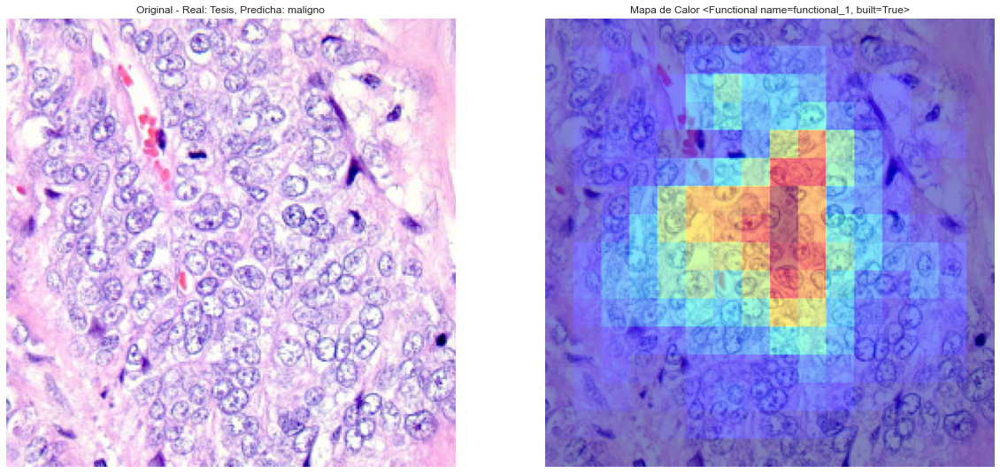

Entrenando el modelo vgg...
Epoch 1/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 418s 1s/step - accuracy: 0.9490 - loss: 0.1608 - val_accuracy: 0.9693 - val_loss: 0.0897
Epoch 2/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 418s 1s/step - accuracy: 0.9921 - loss: 0.0265 - val_accuracy: 0.9880 - val_loss: 0.0302
Epoch 3/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 417s 1s/step - accuracy: 0.9970 - loss: 0.0124 - val_accuracy: 0.9880 - val_loss: 0.0277
Epoch 4/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 416s 1s/step - accuracy: 0.9964 - loss: 0.0117 - val_accuracy: 0.9973 - val_loss: 0.0083
Epoch 5/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 417s 1s/step - accuracy: 0.9967 - loss: 0.0111 - val_accuracy: 0.9980 - val_loss: 0.0076
Epoch 6/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 417s 1s/step - accuracy: 0.9961 - loss: 0.0091 - val_accuracy: 0.9980 - val_loss: 0.0056
Epoch 7/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 416s 1s/step - accuracy: 0.9990 - loss: 0.0037 - val_accuracy: 0.9987 - val_loss: 0.0056
Epoch 8/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 417s 1s/step - accuracy: 0.99

Modelo vgg entrenado con éxito
75/75 ━━━━━━━━━━━━━━━━━━━━ 66s 877ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 22s 880ms/step
Final Validation Metrics for vgg: Accuracy=0.9953, Recall=1.0000, Precision=0.9909, F1=0.9954
Final Test Metrics for vgg: Accuracy=0.9980, Recall=1.0000, Precision=0.9960, F1=0.9980


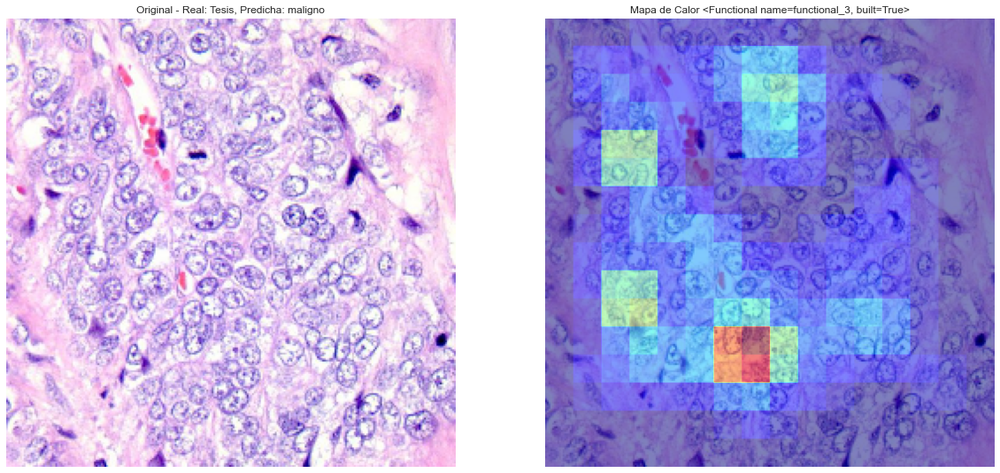

Entrenando el modelo densenet...
Epoch 1/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 185s 451ms/step - accuracy: 0.9712 - loss: 0.0694 - val_accuracy: 0.9960 - val_loss: 0.0124
Epoch 2/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 178s 443ms/step - accuracy: 0.9970 - loss: 0.0076 - val_accuracy: 0.9993 - val_loss: 0.0023
Epoch 3/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 176s 440ms/step - accuracy: 0.9992 - loss: 0.0033 - val_accuracy: 0.9967 - val_loss: 0.0090
Epoch 4/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 177s 443ms/step - accuracy: 0.9988 - loss: 0.0034 - val_accuracy: 0.9993 - val_loss: 0.0014
Epoch 5/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 177s 443ms/step - accuracy: 0.9929 - loss: 0.0331 - val_accuracy: 0.9993 - val_loss: 0.0019
Epoch 6/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 177s 443ms/step - accuracy: 1.0000 - loss: 7.2144e-04 - val_accuracy: 0.9993 - val_loss: 0.0016
Epoch 7/10
400/400 ━━━━━━━━━━━━━━━━━━━━ 178s 444ms/step - accuracy: 0.9999 - loss: 5.1607e-04 - val_accuracy: 0.9993 - val_loss: 0.0012
Epoch 8/10
400/400 ━━━━━━━━━━━━━━━━

Modelo densenet entrenado con éxito
75/75 ━━━━━━━━━━━━━━━━━━━━ 30s 376ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 9s 374ms/step
Final Validation Metrics for densenet: Accuracy=0.9993, Recall=0.9987, Precision=1.0000, F1=0.9993
Final Test Metrics for densenet: Accuracy=1.0000, Recall=1.0000, Precision=1.0000, F1=1.0000


C:\Users\Matias\AppData\Local\Temp\ipykernel_92364\417376711.py:162: RuntimeWarning: invalid value encountered in divide
  mapa_calor = mapa_calor / np.max(mapa_calor)


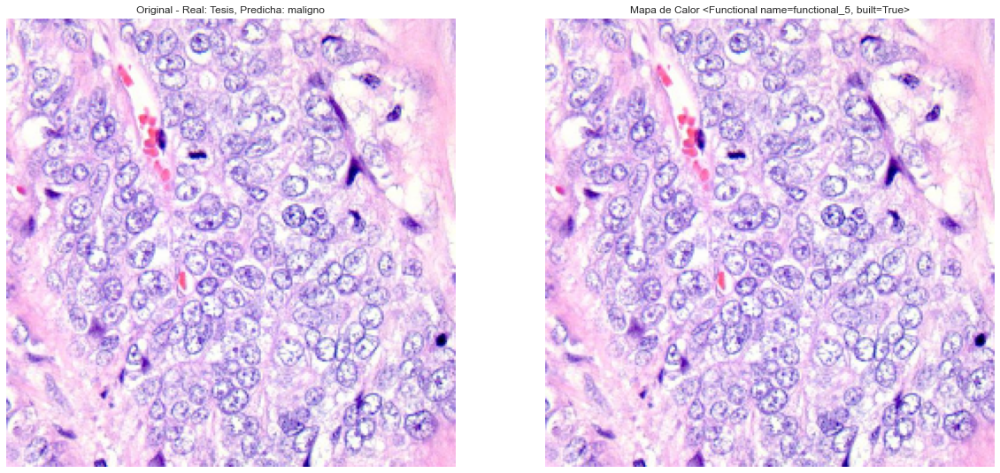

In [7]:
# Dividir el DataFrame en conjuntos de entrenamiento, validación y prueba
df_train_colon, df_val_colon, df_test_colon = dividir_dataframe(df_colon)
print("DataFrames divididos con éxito")

# Crear generadores de datos
train_gen, val_gen = crear_generadores_por_tipo(df_train_colon, df_val_colon)
test_gen = crear_generador_test(df_test_colon)
print("Generadores creados con éxito")

# Entrenar y evaluar los modelos preentrenados para un tipo de cáncer específico o para todos
modelos_preentrenados = ['resnet', 'vgg', 'densenet']

for model_name in modelos_preentrenados:
    print(f"Entrenando el modelo {model_name}...")
    model = get_pretrained_model(model_name)
    model, history = entrenar_modelo(model, train_gen, val_gen, 'colon', model_name)
    print(f"Modelo {model_name} entrenado con éxito")

    # Calcular y mostrar métricas de validación y prueba
    val_metrics = calcular_metricas(model, val_gen)
    test_metrics = calcular_metricas(model, test_gen)
    
    print(f'Final Validation Metrics for {model_name}: Accuracy={val_metrics[0]:.4f}, Recall={val_metrics[1]:.4f}, Precision={val_metrics[2]:.4f}, F1={val_metrics[3]:.4f}')
    print(f'Final Test Metrics for {model_name}: Accuracy={test_metrics[0]:.4f}, Recall={test_metrics[1]:.4f}, Precision={test_metrics[2]:.4f}, F1={test_metrics[3]:.4f}')

    # Ejemplo de uso para generar y mostrar un mapa de calor
    ruta_imagen_ejemplo = df_colon['ruta'].iloc[0]
    generar_mostrar_mapa_calor(ruta_imagen_ejemplo, model)

## Modelo Binario Pulmon

In [4]:
df_pulmon = qol.crear_dataframe_binario(dataset_dir, filtro_cancer='lung')
train_loader_pulmon, val_loader_pulmon, test_loader_pulmon = qol.prepare_data_loaders(df_pulmon, batch_size=80, m_type='bin')
# Preparar los DataLoaders (usando el DataFrame binario como ejemplo)
# Guardar el DataFrame de prueba
_, test_val_df = train_test_split(df_pulmon, test_size=0.3, random_state=46, stratify=df_pulmon['etiqueta'])
_, test_df = train_test_split(test_val_df, test_size=0.33, random_state=46, stratify=test_val_df['etiqueta'])



# Seleccionar una imagen del conjunto de prueba
imagen_prueba = test_df.sample(n=1).iloc[0]
ruta_imagen_prueba = imagen_prueba['ruta']

print(f"Imagen seleccionada: {ruta_imagen_prueba}")
# Entrenar modelo

Imagen seleccionada: C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasias\benigno\lung_benigno_lungn1220.jpeg


In [5]:

model_bmgl= bmgl.train_model(device, train_loader_pulmon, val_loader_pulmon)


# Evaluar modelo
test_accuracy = qol.evaluate_model(device, model_bmgl, test_loader_pulmon)
print(f'Final Test Accuracy: {test_accuracy:.4f}')


try:
    # Ejemplo de uso
    val_metrics, test_metrics = qol.evaluate_model_with_metrics(device, model_bmgl, val_loader_pulmon, test_loader_pulmon)
    print(f'Final Validation Metrics: Accuracy={val_metrics[0]:.4f}, Recall={val_metrics[1]:.4f}, Precision={val_metrics[2]:.4f}, F1={val_metrics[3]:.4f}')
    print(f'Final Test Metrics: Accuracy={test_metrics[0]:.4f}, Recall={test_metrics[1]:.4f}, Precision={test_metrics[2]:.4f}, F1={test_metrics[3]:.4f}')
except:
    print('error')

Validation Accuracy: 0.9990
Test Accuracy: 1.0000
Final Test Accuracy: 1.0000
Validation Accuracy: 0.9990
Test Accuracy: 1.0000
Final Validation Metrics: Accuracy=0.9990, Recall=0.9993, Precision=0.9985, F1=0.9989
Final Test Metrics: Accuracy=1.0000, Recall=1.0000, Precision=1.0000, F1=1.0000


In [6]:
# Definir el estudio
try:
    study_pulmon = optuna.create_study(storage="sqlite:///pulmon_model_opt_deep_2_iteracion.db", study_name="Estudio Clasificador Pulmon Deep 2",direction='maximize')
    study_pulmon.optimize(lambda trial: opt_deep.objective(trial, cancer='all'), n_trials=50, timeout=50000)
except Exception as e:
    print(f"Error during optimization: {e}")

# Guardar el mejor modelo
best_trial = study_pulmon.best_trial
try:
    best_model =opt_deep.Net(
        [best_trial.params[f'num_filters_layer{i}'] for i in range(best_trial.params['num_layers'])], 
        best_trial.params['kernel_size'], 
        best_trial.params['dropout_rate'], 
        2,
        best_trial.params['num_fc_layers']
    ).to(device)
    
    optimizer = optim.Adam(best_model.parameters(), lr=best_trial.params['learning_rate'])
    criterion = nn.CrossEntropyLoss()
    
    # Entrenamiento
    best_model.train()
    for epoch in range(10):
        for images, labels in train_loader_pulmon:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            output = best_model(images)
            loss = criterion(output, labels)
            loss.backward()
            optimizer.step()
            # Free GPU memory
            del images, labels, output
            torch.cuda.empty_cache()
    
    # Guardar el modelo entrenado
    torch.save(best_model.state_dict(), 'pulmon_model_opt_deep.pth')
    
    # Evaluar el mejor modelo en el conjunto de prueba
    best_model.eval()
    all_labels = []
    all_predictions = []
    with torch.no_grad():
        for images, labels in test_loader_pulmon:
            images, labels = images.to(device), labels.to(device)
            outputs = best_model(images)
            _, predicted = torch.max(outputs, 1)
            all_labels.extend(labels.cpu().numpy())
            all_predictions.extend(predicted.cpu().numpy())
            # Free GPU memory
            del images, labels, outputs
            torch.cuda.empty_cache()

    test_accuracy = accuracy_score(all_labels, all_predictions)
    test_recall = recall_score(all_labels, all_predictions, average='weighted')
    test_precision = precision_score(all_labels, all_predictions, average='weighted')
    test_f1 = f1_score(all_labels, all_predictions, average='weighted')

    print(f'Final Test Accuracy: {test_accuracy:.4f}')
    print(f'Final Test Recall: {test_recall:.4f}')
    print(f'Final Test Precision: {test_precision:.4f}')
    print(f'Final Test F1 Score: {test_f1:.4f}')

except Exception as e:
    print(f"Error during model evaluation: {e}")
    # Intentar cargar el último mejor modelo guardado si es posible
    try:
        best_model.load_state_dict(torch.load('pulmon_model_opt_deep.pth'))
        best_model.eval()
        all_labels = []
        all_predictions = []
        with torch.no_grad():
            for images, labels in test_loader_pulmon:
                images, labels = images.to(device), labels.to(device)
                outputs = best_model(images)
                _, predicted = torch.max(outputs, 1)
                all_labels.extend(labels.cpu().numpy())
                all_predictions.extend(predicted.cpu().numpy())
                # Free GPU memory
                del images, labels, outputs
                torch.cuda.empty_cache()
    
        test_accuracy = accuracy_score(all_labels, all_predictions)
        test_recall = recall_score(all_labels, all_predictions, average='weighted')
        test_precision = precision_score(all_labels, all_predictions, average='weighted')
        test_f1 = f1_score(all_labels, all_predictions, average='weighted')
    
        print(f'Final Test Accuracy: {test_accuracy:.4f}')
        print(f'Final Test Recall: {test_recall:.4f}')
        print(f'Final Test Precision: {test_precision:.4f}')
        print(f'Final Test F1 Score: {test_f1:.4f}')
    except Exception as e:
        print(f"Failed to load the last best model: {e}")

[I 2024-09-25 18:51:52,234] A new study created in RDB with name: Estudio Clasificador Pulmon Deep 2
[I 2024-09-25 19:37:51,322] Trial 0 finished with value: 1.0 and parameters: {'num_layers': 2, 'num_fc_layers': 2, 'num_filters_layer0': 256, 'num_filters_layer1': 128, 'kernel_size': 2, 'dropout_rate': 0.6346176423424383, 'learning_rate': 0.0074556731121308666, 'batch_size': 30, 'steps_per_epoch': 150, 'optimizer': 'SGD'}. Best is trial 0 with value: 1.0.
[I 2024-09-25 19:49:53,189] Trial 1 finished with value: 1.0 and parameters: {'num_layers': 1, 'num_fc_layers': 2, 'num_filters_layer0': 64, 'kernel_size': 3, 'dropout_rate': 0.29197687999411737, 'learning_rate': 0.00039017763956524274, 'batch_size': 20, 'steps_per_epoch': 105, 'optimizer': 'RMSprop'}. Best is trial 0 with value: 1.0.
[I 2024-09-25 19:56:13,199] Trial 2 finished with value: 1.0 and parameters: {'num_layers': 4, 'num_fc_layers': 2, 'num_filters_layer0': 64, 'num_filters_layer1': 128, 'num_filters_layer2': 256, 'num_fil

Error during optimization: CUDA out of memory. Tried to allocate 8.00 GiB. GPU 0 has a total capacty of 8.00 GiB of which 0 bytes is free. Of the allocated memory 16.07 GiB is allocated by PyTorch, and 346.88 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF
Error during model evaluation: CUDA out of memory. Tried to allocate 5.04 GiB. GPU 0 has a total capacty of 8.00 GiB of which 0 bytes is free. Of the allocated memory 17.13 GiB is allocated by PyTorch, and 287.35 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF
Failed to load the last best model: Error(s) in loading state_dict for Net:
	Missing key(s) in state_dict: "classifier.8.weight", "classifier.8.bias". 
	Une

### Redes preentrenadas

DataFrames divididos con éxito
Found 12000 validated image filenames belonging to 2 classes.
Found 2250 validated image filenames belonging to 2 classes.
Found 750 validated image filenames belonging to 2 classes.
Generadores creados con éxito
Entrenando el modelo resnet...
Epoch 1/10


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


600/600 ━━━━━━━━━━━━━━━━━━━━ 257s 424ms/step - accuracy: 0.6775 - loss: 0.6326 - val_accuracy: 0.7573 - val_loss: 0.4139
Epoch 2/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 254s 423ms/step - accuracy: 0.8457 - loss: 0.3644 - val_accuracy: 0.9102 - val_loss: 0.2705
Epoch 3/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 254s 423ms/step - accuracy: 0.9123 - loss: 0.2343 - val_accuracy: 0.8893 - val_loss: 0.2701
Epoch 4/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 254s 423ms/step - accuracy: 0.9198 - loss: 0.2002 - val_accuracy: 0.9182 - val_loss: 0.2058
Epoch 5/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 254s 422ms/step - accuracy: 0.9362 - loss: 0.1738 - val_accuracy: 0.9538 - val_loss: 0.1310
Epoch 6/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 253s 422ms/step - accuracy: 0.9335 - loss: 0.1668 - val_accuracy: 0.9520 - val_loss: 0.1210
Epoch 7/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 253s 422ms/step - accuracy: 0.9506 - loss: 0.1323 - val_accuracy: 0.9449 - val_loss: 0.1466
Epoch 8/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 253s 422ms/step - accuracy: 0.9413 - loss: 0.14

Modelo resnet entrenado con éxito
113/113 ━━━━━━━━━━━━━━━━━━━━ 41s 360ms/step


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


38/38 ━━━━━━━━━━━━━━━━━━━━ 13s 351ms/step
Final Validation Metrics for resnet: Accuracy=0.9320, Recall=0.8992, Precision=0.9993, F1=0.9466
Final Test Metrics for resnet: Accuracy=0.9480, Recall=0.9238, Precision=0.9978, F1=0.9594


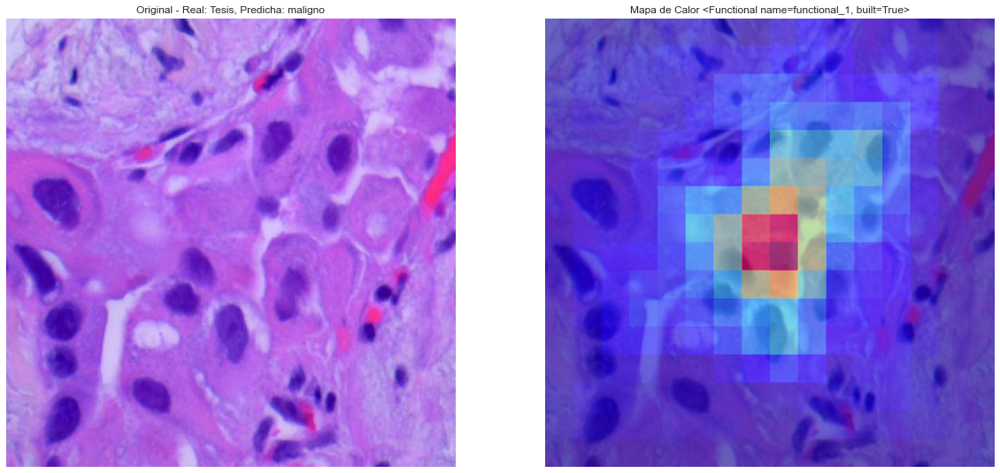

Entrenando el modelo vgg...
Epoch 1/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 623s 1s/step - accuracy: 0.9688 - loss: 0.1059 - val_accuracy: 0.9964 - val_loss: 0.0128
Epoch 2/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 623s 1s/step - accuracy: 0.9962 - loss: 0.0113 - val_accuracy: 0.9951 - val_loss: 0.0164
Epoch 3/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 623s 1s/step - accuracy: 0.9975 - loss: 0.0082 - val_accuracy: 0.9858 - val_loss: 0.0333
Epoch 4/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 623s 1s/step - accuracy: 0.9977 - loss: 0.0061 - val_accuracy: 0.9996 - val_loss: 0.0020
Epoch 5/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 623s 1s/step - accuracy: 0.9995 - loss: 0.0023 - val_accuracy: 0.9982 - val_loss: 0.0056
Epoch 6/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 623s 1s/step - accuracy: 0.9994 - loss: 0.0022 - val_accuracy: 1.0000 - val_loss: 6.1266e-04
Epoch 7/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 622s 1s/step - accuracy: 0.9988 - loss: 0.0045 - val_accuracy: 0.9991 - val_loss: 0.0019
Epoch 8/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 622s 1s/step - accuracy: 

Modelo vgg entrenado con éxito
113/113 ━━━━━━━━━━━━━━━━━━━━ 98s 870ms/step
38/38 ━━━━━━━━━━━━━━━━━━━━ 33s 862ms/step
Final Validation Metrics for vgg: Accuracy=1.0000, Recall=1.0000, Precision=1.0000, F1=1.0000
Final Test Metrics for vgg: Accuracy=1.0000, Recall=1.0000, Precision=1.0000, F1=1.0000


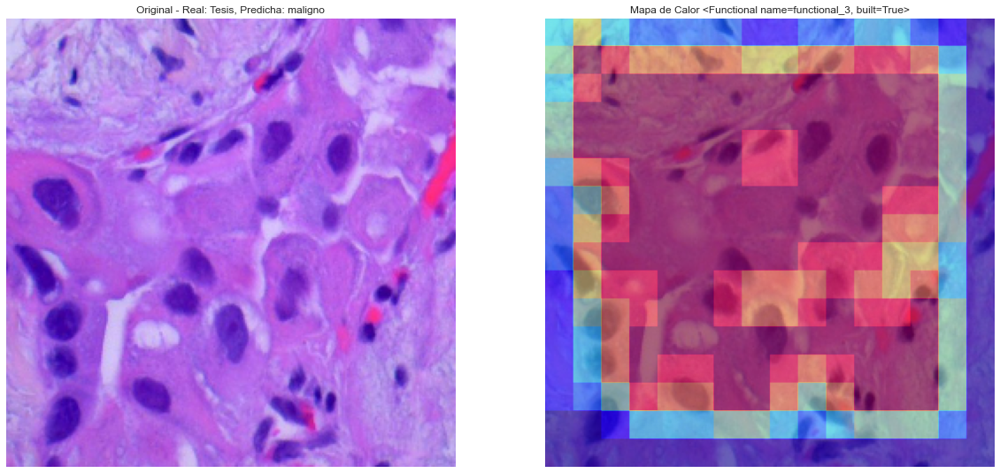

Entrenando el modelo densenet...
Epoch 1/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 292s 478ms/step - accuracy: 0.9893 - loss: 0.0242 - val_accuracy: 1.0000 - val_loss: 7.7463e-04
Epoch 2/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 280s 466ms/step - accuracy: 1.0000 - loss: 7.1030e-04 - val_accuracy: 1.0000 - val_loss: 4.4507e-04
Epoch 3/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 278s 464ms/step - accuracy: 1.0000 - loss: 6.9774e-05 - val_accuracy: 1.0000 - val_loss: 1.2725e-04
Epoch 4/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 278s 463ms/step - accuracy: 1.0000 - loss: 3.6760e-05 - val_accuracy: 1.0000 - val_loss: 8.8691e-05
Epoch 5/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 279s 465ms/step - accuracy: 1.0000 - loss: 2.4533e-05 - val_accuracy: 1.0000 - val_loss: 7.0623e-05
Epoch 6/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 279s 465ms/step - accuracy: 1.0000 - loss: 1.4674e-05 - val_accuracy: 1.0000 - val_loss: 6.0700e-05
Epoch 7/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 280s 466ms/step - accuracy: 1.0000 - loss: 1.2089e-05 - val_accuracy: 1.0000 - val_loss: 6.

Modelo densenet entrenado con éxito
113/113 ━━━━━━━━━━━━━━━━━━━━ 47s 402ms/step
38/38 ━━━━━━━━━━━━━━━━━━━━ 15s 381ms/step
Final Validation Metrics for densenet: Accuracy=1.0000, Recall=1.0000, Precision=1.0000, F1=1.0000
Final Test Metrics for densenet: Accuracy=1.0000, Recall=1.0000, Precision=1.0000, F1=1.0000


C:\Users\Matias\AppData\Local\Temp\ipykernel_113632\417376711.py:162: RuntimeWarning: invalid value encountered in divide
  mapa_calor = mapa_calor / np.max(mapa_calor)


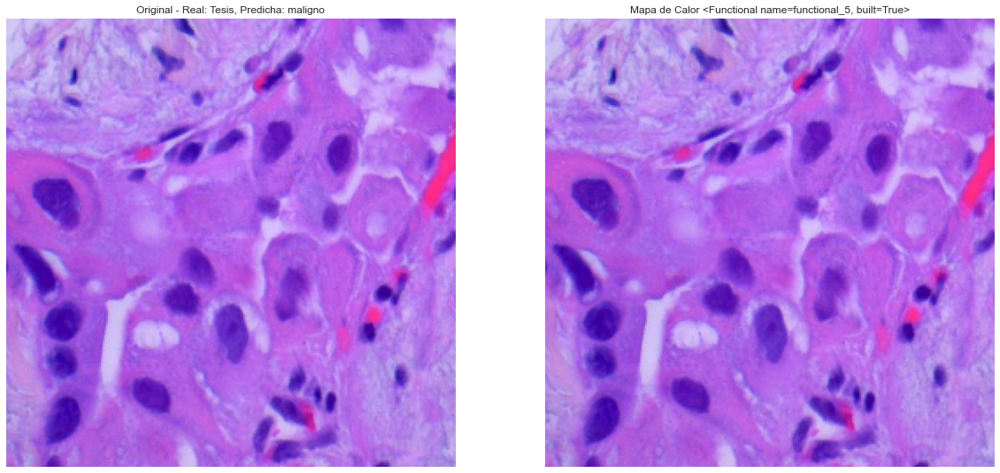

In [7]:
# Dividir el DataFrame en conjuntos de entrenamiento, validación y prueba
df_train_pulmon, df_val_pulmon, df_test_pulmon = dividir_dataframe(df_pulmon)
print("DataFrames divididos con éxito")

# Crear generadores de datos
train_gen, val_gen = crear_generadores_por_tipo(df_train_pulmon, df_val_pulmon)
test_gen = crear_generador_test(df_test_pulmon)
print("Generadores creados con éxito")

# Entrenar y evaluar los modelos preentrenados para un tipo de cáncer específico o para todos
modelos_preentrenados = ['resnet', 'vgg', 'densenet']

for model_name in modelos_preentrenados:
    print(f"Entrenando el modelo {model_name}...")
    model = get_pretrained_model(model_name)
    model, history = entrenar_modelo(model, train_gen, val_gen, 'lung', model_name)
    print(f"Modelo {model_name} entrenado con éxito")

    # Calcular y mostrar métricas de validación y prueba
    val_metrics = calcular_metricas(model, val_gen)
    test_metrics = calcular_metricas(model, test_gen)
    
    print(f'Final Validation Metrics for {model_name}: Accuracy={val_metrics[0]:.4f}, Recall={val_metrics[1]:.4f}, Precision={val_metrics[2]:.4f}, F1={val_metrics[3]:.4f}')
    print(f'Final Test Metrics for {model_name}: Accuracy={test_metrics[0]:.4f}, Recall={test_metrics[1]:.4f}, Precision={test_metrics[2]:.4f}, F1={test_metrics[3]:.4f}')

    # Ejemplo de uso para generar y mostrar un mapa de calor
    ruta_imagen_ejemplo = df_pulmon['ruta'].iloc[0]
    generar_mostrar_mapa_calor(ruta_imagen_ejemplo, model)

## Modelo Binario Gastrointestinal

In [8]:
df_gastrointestinal = qol.crear_dataframe_binario(dataset_dir, filtro_cancer='gastrointestinal')
train_loader_gastrointestinal, val_loader_gastrointestinal, test_loader_gastrointestinal = qol.prepare_data_loaders(df_gastrointestinal, batch_size=80, m_type='bin')
# Preparar los DataLoaders (usando el DataFrame binario como ejemplo)
# Guardar el DataFrame de prueba
_, test_val_df = train_test_split(df_gastrointestinal, test_size=0.3, random_state=46, stratify=df_gastrointestinal['etiqueta'])
_, test_df = train_test_split(test_val_df, test_size=0.33, random_state=46, stratify=test_val_df['etiqueta'])



# Seleccionar una imagen del conjunto de prueba
imagen_prueba = test_df.sample(n=1).iloc[0]
ruta_imagen_prueba = imagen_prueba['ruta']

print(f"Imagen seleccionada: {ruta_imagen_prueba}")

Imagen seleccionada: C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasias\benigno\gastrointestinal_benigno_STR-TDFHNSIIFVFS.png


In [9]:

# Entrenar modelo
model_bmgg= bmgg.train_model(device, train_loader_gastrointestinal, val_loader_gastrointestinal)


# Evaluar modelo
test_accuracy = qol.evaluate_model(device, model_bmgg, test_loader_gastrointestinal)
print(f'Final Test Accuracy: {test_accuracy:.4f}')


try:
    # Ejemplo de uso
    val_metrics, test_metrics = qol.evaluate_model_with_metrics(device, model_bmgc, val_loader_gastrointestinal, test_loader_gastrointestinal)
    print(f'Final Validation Metrics: Accuracy={val_metrics[0]:.4f}, Recall={val_metrics[1]:.4f}, Precision={val_metrics[2]:.4f}, F1={val_metrics[3]:.4f}')
    print(f'Final Test Metrics: Accuracy={test_metrics[0]:.4f}, Recall={test_metrics[1]:.4f}, Precision={test_metrics[2]:.4f}, F1={test_metrics[3]:.4f}')
except:
    print('error')

Validation Accuracy: 0.9745
Test Accuracy: 0.9659
Final Test Accuracy: 0.9659
error


In [10]:
# Definir el estudio
try:
    study_gastrointestinal = optuna.create_study(storage="sqlite:///gastrointestinal_model_opt_deep_2_iteracion.db", study_name="Estudio Clasificador Gastrointestinal Deep 2",direction='maximize')
    study_gastrointestinal.optimize(lambda trial: opt_deep.objective(trial, cancer='all'), n_trials=50, timeout=50000)
except Exception as e:
    print(f"Error during optimization: {e}")

# Guardar el mejor modelo
best_trial = study_gastrointestinal.best_trial
try:
    best_model =opt_deep.Net(
        [best_trial.params[f'num_filters_layer{i}'] for i in range(best_trial.params['num_layers'])], 
        best_trial.params['kernel_size'], 
        best_trial.params['dropout_rate'], 
        2,
        best_trial.params['num_fc_layers']
    ).to(device)
    
    optimizer = optim.Adam(best_model.parameters(), lr=best_trial.params['learning_rate'])
    criterion = nn.CrossEntropyLoss()
    
    # Entrenamiento
    best_model.train()
    for epoch in range(10):
        for images, labels in train_loader_gastrointestinal:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            output = best_model(images)
            loss = criterion(output, labels)
            loss.backward()
            optimizer.step()
            # Free GPU memory
            del images, labels, output
            torch.cuda.empty_cache()
    
    # Guardar el modelo entrenado
    torch.save(best_model.state_dict(), 'gastrointestinal_model_opt_deep.pth')
    
    # Evaluar el mejor modelo en el conjunto de prueba
    best_model.eval()
    all_labels = []
    all_predictions = []
    with torch.no_grad():
        for images, labels in test_loader_gastrointestinal:
            images, labels = images.to(device), labels.to(device)
            outputs = best_model(images)
            _, predicted = torch.max(outputs, 1)
            all_labels.extend(labels.cpu().numpy())
            all_predictions.extend(predicted.cpu().numpy())
            # Free GPU memory
            del images, labels, outputs
            torch.cuda.empty_cache()

    test_accuracy = accuracy_score(all_labels, all_predictions)
    test_recall = recall_score(all_labels, all_predictions, average='weighted')
    test_precision = precision_score(all_labels, all_predictions, average='weighted')
    test_f1 = f1_score(all_labels, all_predictions, average='weighted')

    print(f'Final Test Accuracy: {test_accuracy:.4f}')
    print(f'Final Test Recall: {test_recall:.4f}')
    print(f'Final Test Precision: {test_precision:.4f}')
    print(f'Final Test F1 Score: {test_f1:.4f}')

except Exception as e:
    print(f"Error during model evaluation: {e}")
    # Intentar cargar el último mejor modelo guardado si es posible
    try:
        best_model.load_state_dict(torch.load('gastrointestinal_model_opt_deep.pth'))
        best_model.eval()
        all_labels = []
        all_predictions = []
        with torch.no_grad():
            for images, labels in test_loader_gastrointestinal:
                images, labels = images.to(device), labels.to(device)
                outputs = best_model(images)
                _, predicted = torch.max(outputs, 1)
                all_labels.extend(labels.cpu().numpy())
                all_predictions.extend(predicted.cpu().numpy())
                # Free GPU memory
                del images, labels, outputs
                torch.cuda.empty_cache()
    
        test_accuracy = accuracy_score(all_labels, all_predictions)
        test_recall = recall_score(all_labels, all_predictions, average='weighted')
        test_precision = precision_score(all_labels, all_predictions, average='weighted')
        test_f1 = f1_score(all_labels, all_predictions, average='weighted')
    
        print(f'Final Test Accuracy: {test_accuracy:.4f}')
        print(f'Final Test Recall: {test_recall:.4f}')
        print(f'Final Test Precision: {test_precision:.4f}')
        print(f'Final Test F1 Score: {test_f1:.4f}')
    except Exception as e:
        print(f"Failed to load the last best model: {e}")

[I 2024-09-26 06:48:09,420] A new study created in RDB with name: Estudio Clasificador Gastrointestinal Deep 2
[I 2024-09-26 09:23:13,655] Trial 0 finished with value: 1.0 and parameters: {'num_layers': 5, 'num_fc_layers': 2, 'num_filters_layer0': 128, 'num_filters_layer1': 256, 'num_filters_layer2': 128, 'num_filters_layer3': 64, 'num_filters_layer4': 64, 'kernel_size': 3, 'dropout_rate': 0.6836227189931873, 'learning_rate': 0.007965390133490763, 'batch_size': 60, 'steps_per_epoch': 194, 'optimizer': 'RMSprop'}. Best is trial 0 with value: 1.0.
[I 2024-09-26 09:27:54,875] Trial 1 finished with value: 1.0 and parameters: {'num_layers': 3, 'num_fc_layers': 3, 'num_filters_layer0': 64, 'num_filters_layer1': 64, 'num_filters_layer2': 128, 'kernel_size': 2, 'dropout_rate': 0.6598052731345952, 'learning_rate': 0.0045147369536814325, 'batch_size': 20, 'steps_per_epoch': 152, 'optimizer': 'RMSprop'}. Best is trial 0 with value: 1.0.
[I 2024-09-26 09:35:28,479] Trial 2 finished with value: 1.0

Error during optimization: CUDA out of memory. Tried to allocate 1.88 GiB. GPU 0 has a total capacty of 8.00 GiB of which 0 bytes is free. Of the allocated memory 20.44 GiB is allocated by PyTorch, and 740.77 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF
Error during model evaluation: CUDA out of memory. Tried to allocate 2.50 GiB. GPU 0 has a total capacty of 8.00 GiB of which 0 bytes is free. Of the allocated memory 18.98 GiB is allocated by PyTorch, and 1.18 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF
Failed to load the last best model: Error(s) in loading state_dict for Net:
	Missing key(s) in state_dict: "features.9.weight", "features.9.bias", "features.1

### Redes preentrenadas

DataFrames divididos con éxito
Found 6400 validated image filenames belonging to 2 classes.
Found 1200 validated image filenames belonging to 2 classes.
Found 400 validated image filenames belonging to 2 classes.
Generadores creados con éxito
Entrenando el modelo resnet...
Epoch 1/10


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


320/320 ━━━━━━━━━━━━━━━━━━━━ 149s 455ms/step - accuracy: 0.6468 - loss: 0.6622 - val_accuracy: 0.7533 - val_loss: 0.5144
Epoch 2/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 145s 451ms/step - accuracy: 0.7502 - loss: 0.5192 - val_accuracy: 0.7667 - val_loss: 0.5140
Epoch 3/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 145s 450ms/step - accuracy: 0.7605 - loss: 0.4989 - val_accuracy: 0.7800 - val_loss: 0.4568
Epoch 4/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 145s 450ms/step - accuracy: 0.7795 - loss: 0.4739 - val_accuracy: 0.7442 - val_loss: 0.5480
Epoch 5/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 145s 450ms/step - accuracy: 0.7668 - loss: 0.4843 - val_accuracy: 0.7867 - val_loss: 0.4384
Epoch 6/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 145s 451ms/step - accuracy: 0.7783 - loss: 0.4685 - val_accuracy: 0.7650 - val_loss: 0.4614
Epoch 7/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 145s 450ms/step - accuracy: 0.7819 - loss: 0.4534 - val_accuracy: 0.7008 - val_loss: 0.6161
Epoch 8/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 145s 451ms/step - accuracy: 0.7878 - loss: 0.46

Modelo resnet entrenado con éxito
60/60 ━━━━━━━━━━━━━━━━━━━━ 24s 379ms/step


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


20/20 ━━━━━━━━━━━━━━━━━━━━ 8s 378ms/step
Final Validation Metrics for resnet: Accuracy=0.7967, Recall=0.8490, Precision=0.7760, F1=0.8109
Final Test Metrics for resnet: Accuracy=0.8125, Recall=0.8617, Precision=0.7678, F1=0.8120


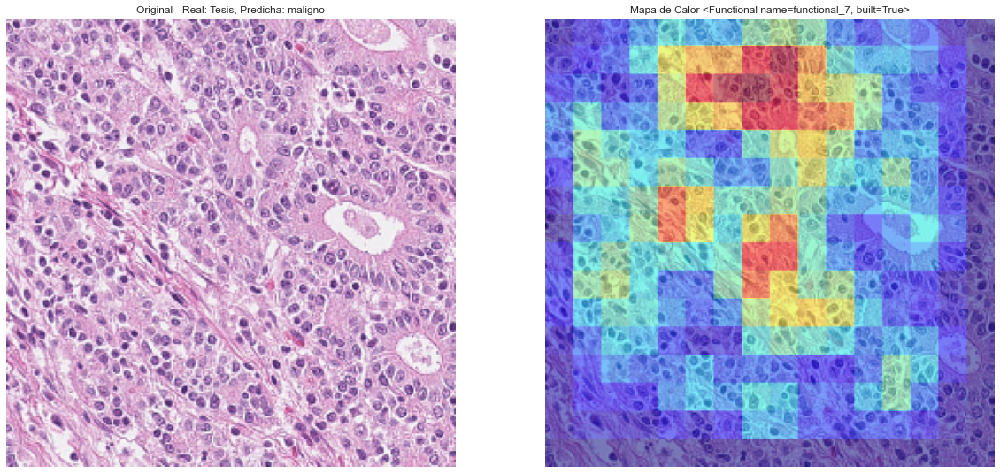

Entrenando el modelo vgg...
Epoch 1/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 347s 1s/step - accuracy: 0.9407 - loss: 0.1763 - val_accuracy: 0.9783 - val_loss: 0.0747
Epoch 2/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 367s 1s/step - accuracy: 0.9823 - loss: 0.0565 - val_accuracy: 0.9758 - val_loss: 0.0735
Epoch 3/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 362s 1s/step - accuracy: 0.9812 - loss: 0.0473 - val_accuracy: 0.9842 - val_loss: 0.0487
Epoch 4/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 344s 1s/step - accuracy: 0.9889 - loss: 0.0316 - val_accuracy: 0.9908 - val_loss: 0.0324
Epoch 5/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 343s 1s/step - accuracy: 0.9897 - loss: 0.0281 - val_accuracy: 0.9892 - val_loss: 0.0338
Epoch 6/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 343s 1s/step - accuracy: 0.9890 - loss: 0.0263 - val_accuracy: 0.9825 - val_loss: 0.0428
Epoch 7/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 343s 1s/step - accuracy: 0.9930 - loss: 0.0186 - val_accuracy: 0.9858 - val_loss: 0.0359
Epoch 8/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 343s 1s/step - accuracy: 0.99

Modelo vgg entrenado con éxito
60/60 ━━━━━━━━━━━━━━━━━━━━ 54s 902ms/step
20/20 ━━━━━━━━━━━━━━━━━━━━ 18s 899ms/step
Final Validation Metrics for vgg: Accuracy=0.9892, Recall=0.9984, Precision=0.9809, F1=0.9895
Final Test Metrics for vgg: Accuracy=0.9900, Recall=0.9947, Precision=0.9842, F1=0.9894


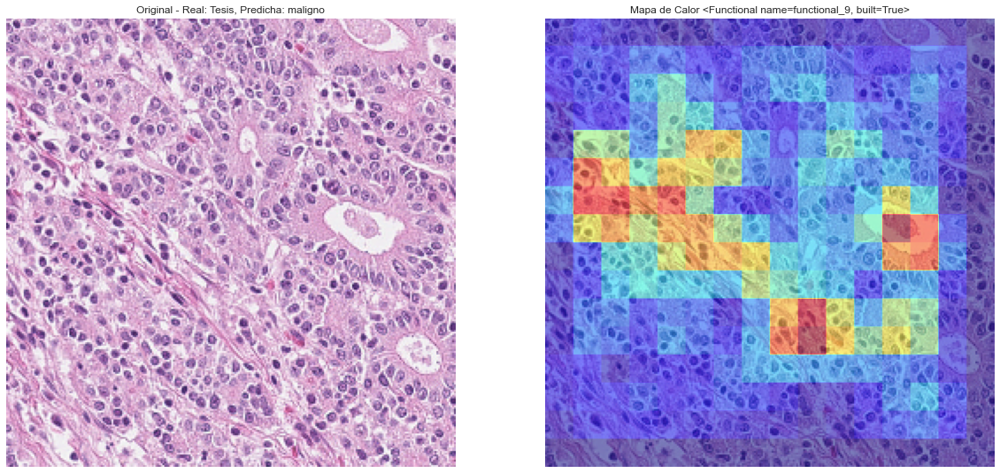

Entrenando el modelo densenet...
Epoch 1/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 184s 557ms/step - accuracy: 0.9348 - loss: 0.1359 - val_accuracy: 0.9908 - val_loss: 0.0249
Epoch 2/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 175s 544ms/step - accuracy: 0.9919 - loss: 0.0251 - val_accuracy: 0.9875 - val_loss: 0.0310
Epoch 3/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 175s 544ms/step - accuracy: 0.9935 - loss: 0.0176 - val_accuracy: 0.9900 - val_loss: 0.0174
Epoch 4/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 175s 544ms/step - accuracy: 0.9961 - loss: 0.0130 - val_accuracy: 0.9925 - val_loss: 0.0128
Epoch 5/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 175s 545ms/step - accuracy: 0.9963 - loss: 0.0080 - val_accuracy: 0.9825 - val_loss: 0.0404
Epoch 6/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 175s 545ms/step - accuracy: 0.9980 - loss: 0.0081 - val_accuracy: 0.9975 - val_loss: 0.0077
Epoch 7/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 175s 543ms/step - accuracy: 0.9977 - loss: 0.0066 - val_accuracy: 0.9917 - val_loss: 0.0255
Epoch 8/10
320/320 ━━━━━━━━━━━━━━━━━━━━ 175

Modelo densenet entrenado con éxito
60/60 ━━━━━━━━━━━━━━━━━━━━ 29s 456ms/step
20/20 ━━━━━━━━━━━━━━━━━━━━ 9s 455ms/step
Final Validation Metrics for densenet: Accuracy=0.9950, Recall=0.9951, Precision=0.9951, F1=0.9951
Final Test Metrics for densenet: Accuracy=0.9975, Recall=1.0000, Precision=0.9947, F1=0.9973


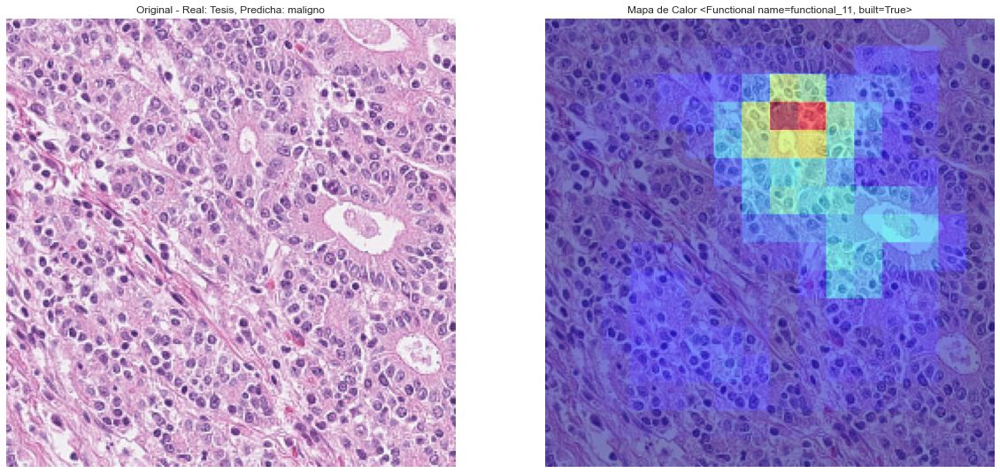

In [11]:
# Dividir el DataFrame en conjuntos de entrenamiento, validación y prueba
df_train_gastrointestinal, df_val_gastrointestinal, df_test_gastrointestinal = dividir_dataframe(df_gastrointestinal)
print("DataFrames divididos con éxito")

# Crear generadores de datos
train_gen, val_gen = crear_generadores_por_tipo(df_train_gastrointestinal, df_val_gastrointestinal)
test_gen = crear_generador_test(df_test_gastrointestinal)
print("Generadores creados con éxito")

# Entrenar y evaluar los modelos preentrenados para un tipo de cáncer específico o para todos
modelos_preentrenados = ['resnet', 'vgg', 'densenet']

for model_name in modelos_preentrenados:
    print(f"Entrenando el modelo {model_name}...")
    model = get_pretrained_model(model_name)
    model, history = entrenar_modelo(model, train_gen, val_gen, 'gastrointestinal', model_name)
    print(f"Modelo {model_name} entrenado con éxito")

    # Calcular y mostrar métricas de validación y prueba
    val_metrics = calcular_metricas(model, val_gen)
    test_metrics = calcular_metricas(model, test_gen)
    
    print(f'Final Validation Metrics for {model_name}: Accuracy={val_metrics[0]:.4f}, Recall={val_metrics[1]:.4f}, Precision={val_metrics[2]:.4f}, F1={val_metrics[3]:.4f}')
    print(f'Final Test Metrics for {model_name}: Accuracy={test_metrics[0]:.4f}, Recall={test_metrics[1]:.4f}, Precision={test_metrics[2]:.4f}, F1={test_metrics[3]:.4f}')

    # Ejemplo de uso para generar y mostrar un mapa de calor
    ruta_imagen_ejemplo = df_gastrointestinal['ruta'].iloc[0]
    generar_mostrar_mapa_calor(ruta_imagen_ejemplo, model)

## Modelo Binario Oral

In [12]:
df_oral = qol.crear_dataframe_binario(dataset_dir, filtro_cancer='oral')
train_loader_oral, val_loader_oral, test_loader_oral = qol.prepare_data_loaders(df_oral, batch_size=80, m_type='bin')
# Preparar los DataLoaders (usando el DataFrame binario como ejemplo)
# Guardar el DataFrame de prueba
_, test_val_df = train_test_split(df_oral, test_size=0.3, random_state=46, stratify=df_oral['etiqueta'])
_, test_df = train_test_split(test_val_df, test_size=0.33, random_state=46, stratify=test_val_df['etiqueta'])



# Seleccionar una imagen del conjunto de prueba
imagen_prueba = test_df.sample(n=1).iloc[0]
ruta_imagen_prueba = imagen_prueba['ruta']

print(f"Imagen seleccionada: {ruta_imagen_prueba}")

Imagen seleccionada: C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasias\SCC\oral_SCC_OSCC_400x_276_1_8fca04a7-76ab-4839-b9f3-6829cda23910_1.JPEG


In [13]:

# Entrenar modelo
model_bmgo= bmgo.train_model(device, train_loader_oral, val_loader_oral)


# Evaluar modelo
test_accuracy = qol.evaluate_model(device, model_bmgo, test_loader_oral)
print(f'Final Test Accuracy: {test_accuracy:.4f}')



try:
    # Ejemplo de uso
    val_metrics, test_metrics = qol.evaluate_model_with_metrics(device, model_bmgo, val_loader_oral, test_loader_oral)
    print(f'Final Validation Metrics: Accuracy={val_metrics[0]:.4f}, Recall={val_metrics[1]:.4f}, Precision={val_metrics[2]:.4f}, F1={val_metrics[3]:.4f}')
    print(f'Final Test Metrics: Accuracy={test_metrics[0]:.4f}, Recall={test_metrics[1]:.4f}, Precision={test_metrics[2]:.4f}, F1={test_metrics[3]:.4f}')
except:
    print('error')

Validation Accuracy: 0.8337
Test Accuracy: 0.8186
Final Test Accuracy: 0.8186
Validation Accuracy: 0.8337
Test Accuracy: 0.8186
Final Validation Metrics: Accuracy=0.8337, Recall=0.7829, Precision=0.7695, F1=0.7757
Final Test Metrics: Accuracy=0.8186, Recall=0.7600, Precision=0.7494, F1=0.7544


In [14]:
# Definir el estudio
try:
    study_oral= optuna.create_study(storage="sqlite:///oral_model_opt_deep_2_iteracion.db", study_name="Estudio Clasificador Oral Deep 2",direction='maximize')
    study_oral.optimize(lambda trial: opt_deep.objective(trial, cancer='all'), n_trials=50, timeout=50000)
except Exception as e:
    print(f"Error during optimization: {e}")

# Guardar el mejor modelo
best_trial = study_oral.best_trial
try:
    best_model =opt_deep.Net(
        [best_trial.params[f'num_filters_layer{i}'] for i in range(best_trial.params['num_layers'])], 
        best_trial.params['kernel_size'], 
        best_trial.params['dropout_rate'], 
        2,
        best_trial.params['num_fc_layers']
    ).to(device)
    
    optimizer = optim.Adam(best_model.parameters(), lr=best_trial.params['learning_rate'])
    criterion = nn.CrossEntropyLoss()
    
    # Entrenamiento
    best_model.train()
    for epoch in range(10):
        for images, labels in train_loader_oral:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            output = best_model(images)
            loss = criterion(output, labels)
            loss.backward()
            optimizer.step()
            # Free GPU memory
            del images, labels, output
            torch.cuda.empty_cache()
    
    # Guardar el modelo entrenado
    torch.save(best_model.state_dict(), 'oral_model_opt_deep.pth')
    
    # Evaluar el mejor modelo en el conjunto de prueba
    best_model.eval()
    all_labels = []
    all_predictions = []
    with torch.no_grad():
        for images, labels in test_loader_oral:
            images, labels = images.to(device), labels.to(device)
            outputs = best_model(images)
            _, predicted = torch.max(outputs, 1)
            all_labels.extend(labels.cpu().numpy())
            all_predictions.extend(predicted.cpu().numpy())
            # Free GPU memory
            del images, labels, outputs
            torch.cuda.empty_cache()

    test_accuracy = accuracy_score(all_labels, all_predictions)
    test_recall = recall_score(all_labels, all_predictions, average='weighted')
    test_precision = precision_score(all_labels, all_predictions, average='weighted')
    test_f1 = f1_score(all_labels, all_predictions, average='weighted')

    print(f'Final Test Accuracy: {test_accuracy:.4f}')
    print(f'Final Test Recall: {test_recall:.4f}')
    print(f'Final Test Precision: {test_precision:.4f}')
    print(f'Final Test F1 Score: {test_f1:.4f}')

except Exception as e:
    print(f"Error during model evaluation: {e}")
    # Intentar cargar el último mejor modelo guardado si es posible
    try:
        best_model.load_state_dict(torch.load('oral_model_opt_deep.pth'))
        best_model.eval()
        all_labels = []
        all_predictions = []
        with torch.no_grad():
            for images, labels in test_loader_oral:
                images, labels = images.to(device), labels.to(device)
                outputs = best_model(images)
                _, predicted = torch.max(outputs, 1)
                all_labels.extend(labels.cpu().numpy())
                all_predictions.extend(predicted.cpu().numpy())
                # Free GPU memory
                del images, labels, outputs
                torch.cuda.empty_cache()
    
        test_accuracy = accuracy_score(all_labels, all_predictions)
        test_recall = recall_score(all_labels, all_predictions, average='weighted')
        test_precision = precision_score(all_labels, all_predictions, average='weighted')
        test_f1 = f1_score(all_labels, all_predictions, average='weighted')
    
        print(f'Final Test Accuracy: {test_accuracy:.4f}')
        print(f'Final Test Recall: {test_recall:.4f}')
        print(f'Final Test Precision: {test_precision:.4f}')
        print(f'Final Test F1 Score: {test_f1:.4f}')
    except Exception as e:
        print(f"Failed to load the last best model: {e}")

[I 2024-09-27 00:33:18,769] A new study created in RDB with name: Estudio Clasificador Oral Deep 2
[I 2024-09-27 01:04:29,419] Trial 0 finished with value: 1.0 and parameters: {'num_layers': 3, 'num_fc_layers': 2, 'num_filters_layer0': 64, 'num_filters_layer1': 256, 'num_filters_layer2': 256, 'kernel_size': 2, 'dropout_rate': 0.2557976912589571, 'learning_rate': 0.005020156247672993, 'batch_size': 60, 'steps_per_epoch': 172, 'optimizer': 'Adam'}. Best is trial 0 with value: 1.0.
[I 2024-09-27 01:18:49,253] Trial 1 finished with value: 1.0 and parameters: {'num_layers': 6, 'num_fc_layers': 2, 'num_filters_layer0': 128, 'num_filters_layer1': 256, 'num_filters_layer2': 256, 'num_filters_layer3': 128, 'num_filters_layer4': 64, 'num_filters_layer5': 128, 'kernel_size': 3, 'dropout_rate': 0.34887290062929976, 'learning_rate': 0.00943455183051397, 'batch_size': 30, 'steps_per_epoch': 186, 'optimizer': 'Adam'}. Best is trial 0 with value: 1.0.
[I 2024-09-27 01:28:00,110] Trial 2 finished with 

Error during optimization: CUDA out of memory. Tried to allocate 8.00 GiB. GPU 0 has a total capacty of 8.00 GiB of which 0 bytes is free. Of the allocated memory 15.97 GiB is allocated by PyTorch, and 2.23 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF
Error during model evaluation: CUDA out of memory. Tried to allocate 1.27 GiB. GPU 0 has a total capacty of 8.00 GiB of which 0 bytes is free. Of the allocated memory 20.43 GiB is allocated by PyTorch, and 1.58 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF
Failed to load the last best model: [Errno 2] No such file or directory: 'oral_model_opt_deep.pth'


### Redes Preentrenadas

DataFrames divididos con éxito
Found 9790 validated image filenames belonging to 2 classes.
Found 1841 validated image filenames belonging to 2 classes.
Found 609 validated image filenames belonging to 2 classes.


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\legacy\preprocessing\image.py:920: UserWarning: Found 981 invalid image filename(s) in x_col="ruta". These filename(s) will be ignored.
  warnings.warn(
c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\legacy\preprocessing\image.py:920: UserWarning: Found 178 invalid image filename(s) in x_col="ruta". These filename(s) will be ignored.
  warnings.warn(
c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\legacy\preprocessing\image.py:920: UserWarning: Found 65 invalid image filename(s) in x_col="ruta". These filename(s) will be ignored.
  warnings.warn(


Generadores creados con éxito
Entrenando el modelo resnet...
Epoch 1/10


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


490/490 ━━━━━━━━━━━━━━━━━━━━ 221s 446ms/step - accuracy: 0.7174 - loss: 0.6206 - val_accuracy: 0.7610 - val_loss: 0.5855
Epoch 2/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 217s 442ms/step - accuracy: 0.7655 - loss: 0.5616 - val_accuracy: 0.7626 - val_loss: 0.5333
Epoch 3/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 216s 441ms/step - accuracy: 0.7632 - loss: 0.5439 - val_accuracy: 0.7626 - val_loss: 0.5321
Epoch 4/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 216s 441ms/step - accuracy: 0.7611 - loss: 0.5463 - val_accuracy: 0.7626 - val_loss: 0.5405
Epoch 5/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 216s 440ms/step - accuracy: 0.7571 - loss: 0.5483 - val_accuracy: 0.7626 - val_loss: 0.5303
Epoch 6/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 215s 439ms/step - accuracy: 0.7636 - loss: 0.5380 - val_accuracy: 0.7626 - val_loss: 0.5316
Epoch 7/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 216s 441ms/step - accuracy: 0.7683 - loss: 0.5315 - val_accuracy: 0.7626 - val_loss: 0.5300
Epoch 8/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 217s 442ms/step - accuracy: 0.7645 - loss: 0.53

Modelo resnet entrenado con éxito
93/93 ━━━━━━━━━━━━━━━━━━━━ 36s 375ms/step


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


31/31 ━━━━━━━━━━━━━━━━━━━━ 11s 364ms/step
Final Validation Metrics for resnet: Accuracy=0.7626, Recall=1.0000, Precision=0.7626, F1=0.8653
Final Test Metrics for resnet: Accuracy=0.7685, Recall=1.0000, Precision=0.7685, F1=0.8691


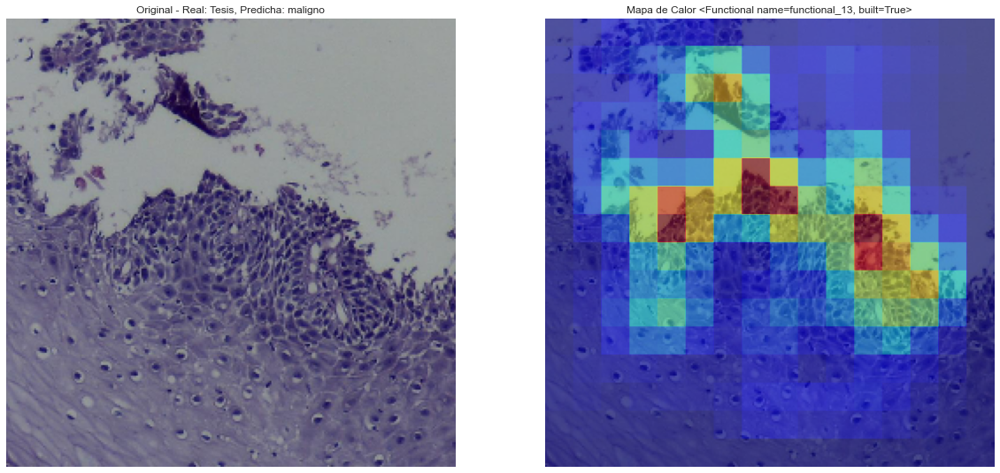

Entrenando el modelo vgg...
Epoch 1/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 511s 1s/step - accuracy: 0.7700 - loss: 0.4932 - val_accuracy: 0.7882 - val_loss: 0.4234
Epoch 2/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 509s 1s/step - accuracy: 0.7928 - loss: 0.4302 - val_accuracy: 0.7936 - val_loss: 0.4035
Epoch 3/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 511s 1s/step - accuracy: 0.8149 - loss: 0.3942 - val_accuracy: 0.8365 - val_loss: 0.3764
Epoch 4/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 510s 1s/step - accuracy: 0.8267 - loss: 0.3731 - val_accuracy: 0.8175 - val_loss: 0.3649
Epoch 5/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 508s 1s/step - accuracy: 0.8556 - loss: 0.3386 - val_accuracy: 0.8267 - val_loss: 0.3467
Epoch 6/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 508s 1s/step - accuracy: 0.8595 - loss: 0.3250 - val_accuracy: 0.8349 - val_loss: 0.3608
Epoch 7/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 508s 1s/step - accuracy: 0.8820 - loss: 0.2866 - val_accuracy: 0.8713 - val_loss: 0.2878
Epoch 8/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 510s 1s/step - accuracy: 0.88

Modelo vgg entrenado con éxito
93/93 ━━━━━━━━━━━━━━━━━━━━ 81s 867ms/step
31/31 ━━━━━━━━━━━━━━━━━━━━ 27s 860ms/step
Final Validation Metrics for vgg: Accuracy=0.9093, Recall=0.9644, Precision=0.9205, F1=0.9419
Final Test Metrics for vgg: Accuracy=0.9064, Recall=0.9594, Precision=0.9220, F1=0.9403


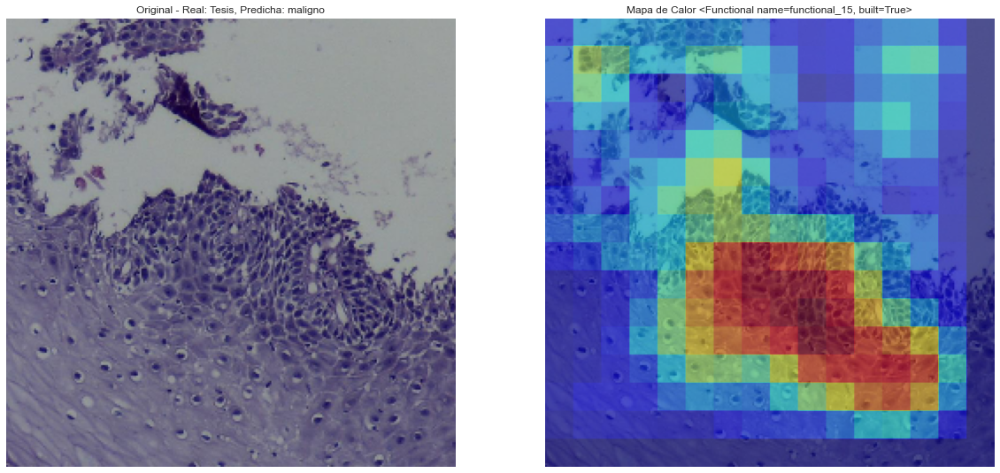

Entrenando el modelo densenet...
Epoch 1/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 276s 552ms/step - accuracy: 0.8008 - loss: 0.4344 - val_accuracy: 0.8740 - val_loss: 0.2952
Epoch 2/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 262s 535ms/step - accuracy: 0.8864 - loss: 0.2651 - val_accuracy: 0.9044 - val_loss: 0.2323
Epoch 3/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 263s 536ms/step - accuracy: 0.9259 - loss: 0.1927 - val_accuracy: 0.9229 - val_loss: 0.1885
Epoch 4/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 262s 535ms/step - accuracy: 0.9431 - loss: 0.1478 - val_accuracy: 0.9364 - val_loss: 0.1629
Epoch 5/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 263s 536ms/step - accuracy: 0.9598 - loss: 0.1123 - val_accuracy: 0.9256 - val_loss: 0.1791
Epoch 6/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 262s 535ms/step - accuracy: 0.9664 - loss: 0.0968 - val_accuracy: 0.9321 - val_loss: 0.1652
Epoch 7/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 263s 536ms/step - accuracy: 0.9739 - loss: 0.0757 - val_accuracy: 0.9565 - val_loss: 0.1009
Epoch 8/10
490/490 ━━━━━━━━━━━━━━━━━━━━ 262

Modelo densenet entrenado con éxito
93/93 ━━━━━━━━━━━━━━━━━━━━ 43s 452ms/step
31/31 ━━━━━━━━━━━━━━━━━━━━ 13s 432ms/step
Final Validation Metrics for densenet: Accuracy=0.9641, Recall=0.9801, Precision=0.9731, F1=0.9766
Final Test Metrics for densenet: Accuracy=0.9622, Recall=0.9786, Precision=0.9724, F1=0.9755


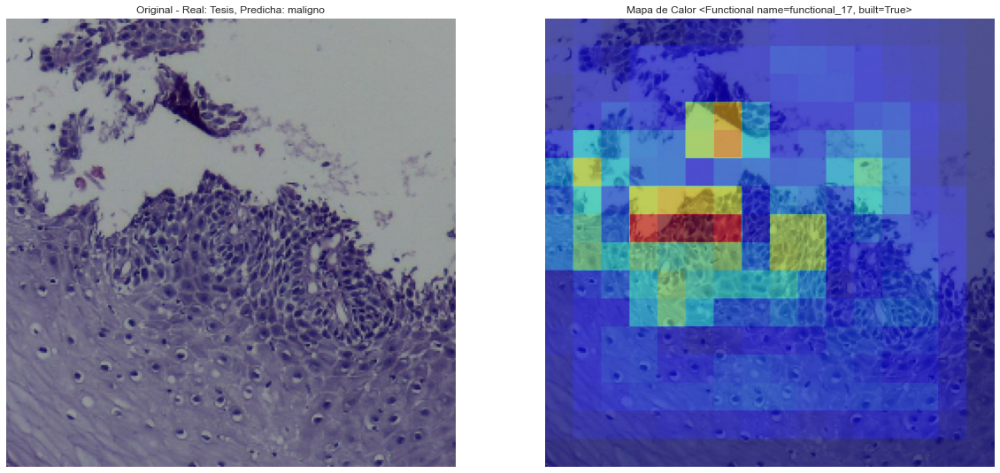

In [15]:
# Dividir el DataFrame en conjuntos de entrenamiento, validación y prueba
df_train_oral, df_val_oral, df_test_oral = dividir_dataframe(df_oral)
print("DataFrames divididos con éxito")

# Crear generadores de datos
train_gen, val_gen = crear_generadores_por_tipo(df_train_oral, df_val_oral)
test_gen = crear_generador_test(df_test_oral)
print("Generadores creados con éxito")

# Entrenar y evaluar los modelos preentrenados para un tipo de cáncer específico o para todos
modelos_preentrenados = ['resnet', 'vgg', 'densenet']

for model_name in modelos_preentrenados:
    print(f"Entrenando el modelo {model_name}...")
    model = get_pretrained_model(model_name)
    model, history = entrenar_modelo(model, train_gen, val_gen, 'oral', model_name)
    print(f"Modelo {model_name} entrenado con éxito")

    # Calcular y mostrar métricas de validación y prueba
    val_metrics = calcular_metricas(model, val_gen)
    test_metrics = calcular_metricas(model, test_gen)
    
    print(f'Final Validation Metrics for {model_name}: Accuracy={val_metrics[0]:.4f}, Recall={val_metrics[1]:.4f}, Precision={val_metrics[2]:.4f}, F1={val_metrics[3]:.4f}')
    print(f'Final Test Metrics for {model_name}: Accuracy={test_metrics[0]:.4f}, Recall={test_metrics[1]:.4f}, Precision={test_metrics[2]:.4f}, F1={test_metrics[3]:.4f}')

    # Ejemplo de uso para generar y mostrar un mapa de calor
    ruta_imagen_ejemplo = df_oral['ruta'].iloc[0]
    generar_mostrar_mapa_calor(ruta_imagen_ejemplo, model)